# Learning On vs. Off Manifold Learning with Recurrent vs. Upstream Learning

June 10, 2022

Notebook updated from `ON-vs-OFF-Manifold-2022-2-22.ipynb` and `Manifold-Feedback-2022-4-22.ipynb`

The goal of this notebook is to test whether training feedback weights alone can learn ON and OFF manifold perturbations

Below, I follow the computational setup of Feulner and Clopath 2021

1. Train the recurrent weights `w_rec` of a network with random readout
2. Do PCA on activity, get matrix `C` with PCA
3. Find Decoder `D` with offline regression (i.e. on 50 trials without learning)

**Applying Perturbations**

*It is important to control for weak vs. strong perturbations. I do this by generating 200 different perturbations, and choosing perturbations that lead to cursor trajectories with (A) lower loss/MSE or (B) mean loss/MSE. Ideally we want both `T_wm` and `T_om` to have the same effect on loss/MSE. In order to do this, we want to be able to control how aligned the perturbation is with the pretrained decoder*

4. Apply within manifold perturbation with `T_wm` and train `W_fb` alone
5. Apply out of manifold perturbation with `T_om` and train `W_fb` alone

## 1. Train Network

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# analysis
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.linear_model import LinearRegression
from scipy import stats, interpolate
from scipy import linalg as LA
from scipy.ndimage.filters import uniform_filter1d

# miscellaneous
from tqdm import tqdm
from itertools import cycle
from copy import deepcopy

import logging
import warnings
import dataclasses
from dataclasses import dataclass
from typing import Optional, List

import sys
sys.path.append("../..")

In [2]:
from rnn import RNNparams, RNN
from task import Task
from simulation import Simulation
from algorithms.rflo import RFLO
from algorithms.bptt import BPTT
from algorithms.reinforce import REINFORCE
from algorithms.track_vars import TrackVars

from utils.plotting import plot_trained_trajectories

In [3]:
trial_duration = 20
n_in=8
frac_on = 1 # notice here the input duration - this usually makes the task easier

x_tonic = 0.0*np.ones((trial_duration, n_in)) # shape 20 x 4 i.e. time x channel
x_pulse1 = x_tonic.copy()
x_pulse2 = x_tonic.copy()
x_pulse3 = x_tonic.copy()
x_pulse4 = x_tonic.copy()
x_pulse5 = x_tonic.copy()
x_pulse6 = x_tonic.copy()
x_pulse7 = x_tonic.copy()
x_pulse8 = x_tonic.copy()

x_pulse1[0:int(trial_duration*frac_on),0] = 1
x_pulse2[0:int(trial_duration*frac_on),1] = 1
x_pulse3[0:int(trial_duration*frac_on),2] = 1
x_pulse4[0:int(trial_duration*frac_on),3] = 1

x_pulse5[0:int(trial_duration*frac_on),4] = 1
x_pulse6[0:int(trial_duration*frac_on),5] = 1
x_pulse7[0:int(trial_duration*frac_on),6] = 1
x_pulse8[0:int(trial_duration*frac_on),7] = 1

# task1 = Task(x_in=x_pulse1,y_target=np.asarray([[1],[1]]))
# task2 = Task(x_in=x_pulse2,y_target=np.asarray([[-1],[1]]))
# task3 = Task(x_in=x_pulse3,y_target=np.asarray([[1],[-1]]))
# task4 = Task(x_in=x_pulse4,y_target=np.asarray([[-1],[-1]]))

task1 = Task(x_in=x_pulse1,y_target=np.asarray([[np.sin(0)],[np.cos(0)]]))
task2 = Task(x_in=x_pulse2,y_target=np.asarray([[np.sin(np.pi/2)],[np.cos(np.pi/2)]]))
task3 = Task(x_in=x_pulse3,y_target=np.asarray([[np.sin(np.pi)],[np.cos(np.pi)]]))
task4 = Task(x_in=x_pulse4,y_target=np.asarray([[np.sin(3*np.pi/2)],[np.cos(3*np.pi/2)]]))

task5 = Task(x_in=x_pulse5,y_target=np.asarray([[np.sin(np.pi/4)],[np.cos(np.pi/4)]]))
task6 = Task(x_in=x_pulse6,y_target=np.asarray([[np.sin(3*np.pi/4)],[np.cos(3*np.pi/4)]]))
task7 = Task(x_in=x_pulse7,y_target=np.asarray([[np.sin(5*np.pi/4)],[np.cos(5*np.pi/4)]]))
task8 = Task(x_in=x_pulse8,y_target=np.asarray([[np.sin(7*np.pi/4)],[np.cos(7*np.pi/4)]]))

1it [00:00,  9.69it/s]

n_in: 8
n_rec: 40
n_out: 2
sig_in: 0.0
sig_rec: 0.1
sig_out: 0.01
tau_rec: 10
dt: 1.0
eta_in: 0.1
eta_rec: 0.25
eta_out: 0.1
g_in: 2.0
g_rec: 1.5
g_out: 2.0
g_fb: 5
driving_feedback: True
eta_fb: 0.25
sig_fb: 0.1
feedback_signal: position
velocity_transform: False
tau_vel: 0.8
dt_vel: 0.1
sig_rec_dim: None
eta_m: None
sig_m: None
lam_m: None
rng: <mtrand.RandomState object at 0x7fcaea70daf8>


2500it [00:30, 82.72it/s]


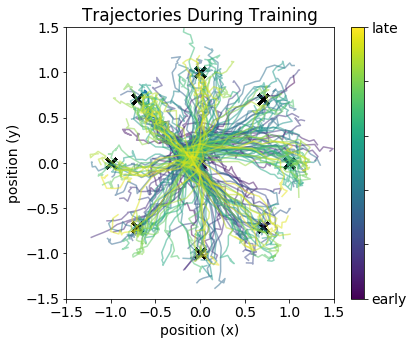

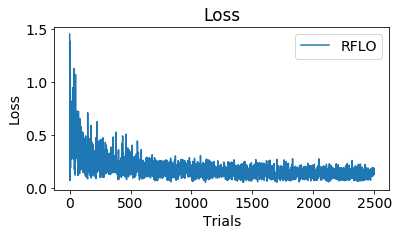

In [4]:
# Set RNN Parameters
params = RNNparams(n_in=8,n_rec=40,n_out=2,tau_rec=10,
               eta_in=0.1,eta_rec=0.25,eta_out=0.1,eta_fb=0.25,g_fb=5,
               sig_in=0.0,sig_rec=0.1,sig_out=0.01, sig_fb=0.1,
               velocity_transform=False, tau_vel = 0.8, dt_vel = 0.1,
               driving_feedback=True,
               rng=np.random.RandomState(675580)) #28925, 474222
params.print_params()

# Initialize RNN
net0 = RNN(params)

# initialize simulation
sim0 = Simulation(net0)

rflo = RFLO(net0,apply_to=['w_rec','w_fb'],error_fn='distance') 
sim0.run_session(n_trials=2500, tasks=[task1,task2,task3,task4,task5,task6,task7,task8], learn_alg=[rflo], probe_types=['h','y_out','pos'], plot=True, plot_freq=10)



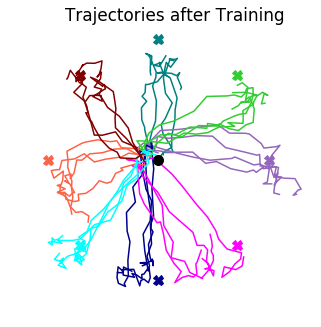

In [5]:
fig = plot_trained_trajectories(sim=sim0, tasks=[task1,task2,task3,task4,task5,task6,task7,task8])


500it [00:03, 157.97it/s]


(20, 40, 1)

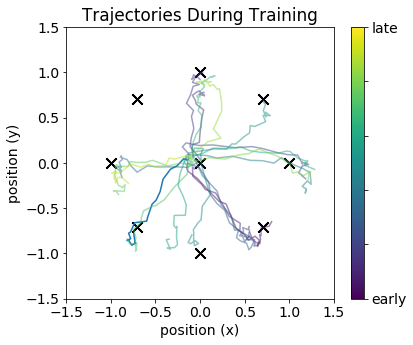

In [6]:
""" Run for 500 trials without learning
Save activity and position output for 50 trials.
This is then used for constructing a decoder.
"""

sim0.run_session(n_trials=500, tasks=[task1,task2,task3,task4,task5,task6,task7,task8], learn_alg=[], probe_types=['h','y_out','pos'], plot=True, plot_freq=25,train=False)

sim0.session_probes['h'][0].shape # 1 for each trial, then (20,200,1) matrix for 200 neurons

## 2. Do PCA on activity, get matrix `C` with PCA

In [7]:
""" Apply PCA """

# concatenate data
activity = sim0.session_probes['h'][0].squeeze()
print(activity.shape)

for i in range(1,len(sim0.session_probes['h'])):
    activity = np.vstack((activity,sim0.session_probes['h'][i].squeeze()))
    
print('n_samples,n_features: ',activity.shape)

(20, 40)
n_samples,n_features:  (10000, 40)


C:  (10, 40)


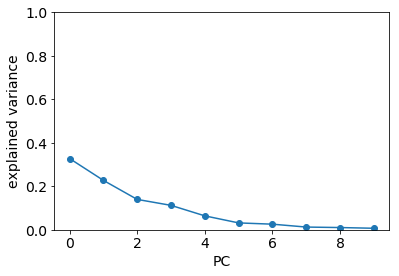

In [8]:
pca = PCA(n_components=10)
pca.fit(activity)
C = pca.components_

print('C: ',pca.components_.shape)
#plt.plot(pca.explained_variance_/np.sum(pca.explained_variance_),'o-') # same dealio
plt.plot(pca.explained_variance_ratio_,'o-')
plt.ylabel('explained variance')
plt.xlabel('PC')
plt.ylim([0,1])
plt.show()

In [9]:
""" Test that transformation is correct with sklearn"""
activity_lowD_pca = pca.transform(activity)

activity_lowD_test = C @ (activity.T - np.repeat(np.expand_dims(pca.mean_,1),activity.shape[0],axis=1))

np.sum(activity_lowD_pca - activity_lowD_test.T) #test

0.0

## 3. Find Decoder `D` with offline regression

In [10]:
""" Compare with cursor location """
pos = sim0.session_probes['pos'][0].squeeze()
print(pos.shape)

for i in range(1,len(sim0.session_probes['pos'])):
    pos = np.vstack((pos,sim0.session_probes['pos'][i].squeeze()))
print(pos.shape)

lr = LinearRegression(fit_intercept=False)
lr.fit((C @ activity.T).T, pos)
D = lr.coef_

print(D.shape)

(20, 2)
(10000, 2)
(2, 10)


500it [00:16, 18.69it/s]


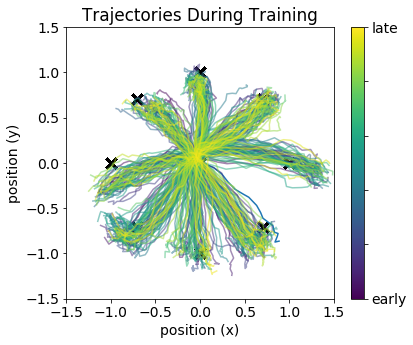

In [11]:
""" Test new decoder """

net1 = RNN(params)


if net0.w_fb.any():
    net1.set_weights(w_in=np.copy(net0.w_in),w_rec=np.copy(net0.w_rec),w_fb=np.copy(net0.w_fb))
else:
    net1.set_weights(w_in=np.copy(net0.w_in),w_rec=np.copy(net0.w_rec))

net1.set_weights(w_out=D@C, w_m=(D@C).T) # set w_out and w_m

# initialize simulation, no learning here
sim1 = Simulation(net1)
# rflo1 = RFLO(net1,apply_to=['w_rec']) 
# sim1.run_session(n_trials=500, tasks=[task1,task2,task3,task4], learn_alg=[rflo1], probe_types=['h','y_out','pos'], plot=True, plot_freq=10,train=True)
sim1.run_session(n_trials=500, tasks=[task1,task2,task3,task4,task5,task6,task7,task8], learn_alg=[], probe_types=['h','y_out','pos'], plot=True, plot_freq=1,train=False)


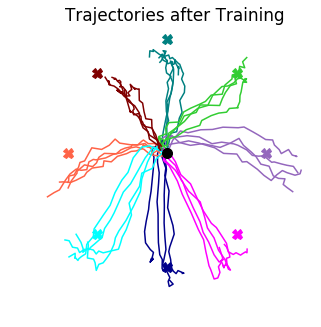

In [12]:
fig = plot_trained_trajectories(sim=sim1, tasks=[task1,task2,task3,task4,task5,task6,task7,task8])


## 4A. Apply within manifold perturbation with `T_wm`

In [13]:
def cos_sim(a,b):
    """ cosine similarity between vectors """
    return np.dot(a, b)/(np.linalg.norm(a)*np.linalg.norm(b))



def permute_matrix(perm_dim,non_perm_dim,rng=np.random.RandomState(1)):
    
    """ Create permutation matrix where bottom rows are permuted (perm_dm)
    Permutes lowest PCs first..."""
    
    perm = rng.permutation(np.eye(perm_dim))
    perm1 = np.hstack((np.eye(non_perm_dim) ,np.zeros((non_perm_dim,perm_dim))))
    perm2 = np.hstack((np.zeros((perm_dim,non_perm_dim)),perm))
    perm3 = np.vstack((perm1,perm2))
    
    return perm3


""" Calculate Manifold overlap """

def activity_covariance(sim,C=None,verbose=True):
    
    """ Calculate activity covariance and manifold """
    h = sim.session_probes['h'][0].squeeze()
    
    if verbose: print(h.shape)

    for i in range(1,len(sim.session_probes['h'])):
        h = np.vstack((h,sim.session_probes['h'][i].squeeze()))
    if verbose: print(h.shape)

    cov = np.cov(h.T) # row is variable, col is observation
    
    beta = np.trace(C @ cov @ C.T) / np.trace(cov)
    
    return cov, beta

### Find reasonable T_wm matrices

In [14]:
def compare_permutation_matrices(n_comparisons=10,
                                 params=None,
                                 net=None,
                                 C=None,
                                 D=None,
                                 perm_dim=None,
                                 perturbation='within_manifold',
                                 plot=True,
                                 verbose=True):
    
    
    """
    Compare Permutation Matrices
    
    n_comparisons (int): How many different permutations to search
    params (RNNparams): parameters object from RNNparams class
    net (RNN): network class
    C (np.array): PC matrix
    D (np.array): offline regression matrix
    perm_dim (int): how many rows to permute in permutation matrix. Permutation from bottom rows first (i.e. lowest PCs)
    perturbation (str): 'within_manifold' or 'outside_manifold'
    plot
    verbose
    
    """
    
    
    mean_list =[]
    perm_list = []
    overlap_list = []
    seeds = np.arange(0,n_comparisons)
    for seed in seeds:
        
        exp_rng = np.random.RandomState(seed)
        
        """ Initialize Test Network """
        net_test = RNN(params)
        
        if net.w_fb.any():
            net_test.set_weights(w_in=np.copy(net.w_in),w_rec=np.copy(net.w_rec),w_m=np.copy(net.w_m),w_fb=np.copy(net.w_fb)) # keep "nonpermuted" internal matrix
        else:
            net_test.set_weights(w_in=np.copy(net.w_in),w_rec=np.copy(net.w_rec),w_m=np.copy(net.w_m)) # keep "nonpermuted" internal matrix
        
        
        
        if verbose: print('RandomState',exp_rng)
        
        """ Permuting entire matrix leads to zero overlap """

        if perturbation == 'within_manifold':
            perm_wm = permute_matrix(perm_dim=perm_dim,non_perm_dim=C.shape[0]-perm_dim,rng=exp_rng)

            if verbose: print('\nperm_wm.shape = ',perm_wm.shape)
            if verbose: print('\nperm_wm: \n',perm_wm)

            T = np.copy(net.w_m).T
            T_wm = D @ perm_wm @ C
            
            perm_list.append(perm_wm)

            """ overlap of T and T_wm """
            overlap = cos_sim(T.ravel(),T_wm.ravel())
            overlap_list.append(overlap)
            if verbose: print('\nT_wm cosine overlap: {:.3f}'.format(overlap))
                
                
            # set w_out
            net_test.set_weights(w_out=T_wm)
                
                
        if perturbation == 'outside_manifold':
            
            """ Permuting entire matrix leads to zero overlap """
            perm_om = permute_matrix(perm_dim=perm_dim,non_perm_dim=C.shape[1]-perm_dim,rng=exp_rng)
            if verbose: print('\nperm_om.shape = ',perm_om.shape)

            T = np.copy(net.w_m).T
            T_om = D @ C @ perm_om
            
            perm_list.append(perm_om)

            """ overlap of T and T_om """
            overlap = cos_sim(T.ravel(),T_om.ravel())
            overlap_list.append(overlap)
            if verbose: print('\nT_om cosine overlap: {:.3f}'.format(overlap))
                
                
            # set w_out
            net_test.set_weights(w_out=T_om)


                
                
        

        
        

        # initialize simulation
        sim = Simulation(net_test)

        track_vars = TrackVars(net_test,apply_to=[]) # weight_transport doesn't matter here, because we are not learning w_out
        # note that train=False, but we still need a learning rule object to store the loss
        sim.run_session(n_trials=10, tasks=[task1,task2,task3,task4], learn_alg=[track_vars], probe_types=['loss'], plot=plot, plot_freq=1,train=True)

        # calculate mean MSE loss for each matrix
        mean_list.append(np.mean(np.asarray(sim.probes['loss'])))
        
        
    return perm_list,mean_list,overlap_list,seeds

## Find best and worst within manifold permutations

In [15]:
perm_list_wm,mean_list_wm,overlap_list_wm,seeds_wm = compare_permutation_matrices(n_comparisons=500,
                                                         params=params,
                                                         net=net1,
                                                         C=C,
                                                         D=D,
                                                         perm_dim=6,
                                                         perturbation='within_manifold',
                                                         plot=False,
                                                         verbose=False)



10it [00:00, 95.57it/s]
10it [00:00, 65.09it/s]
10it [00:00, 143.36it/s]
10it [00:00, 115.27it/s]
10it [00:00, 129.20it/s]
10it [00:00, 117.47it/s]
10it [00:00, 132.65it/s]
10it [00:00, 130.14it/s]
10it [00:00, 137.19it/s]
10it [00:00, 137.17it/s]
10it [00:00, 146.67it/s]
10it [00:00, 141.64it/s]
10it [00:00, 130.05it/s]
10it [00:00, 130.98it/s]
10it [00:00, 119.08it/s]
10it [00:00, 140.53it/s]
10it [00:00, 134.93it/s]
10it [00:00, 112.38it/s]
10it [00:00, 68.69it/s]
10it [00:00, 127.24it/s]
10it [00:00, 157.78it/s]
10it [00:00, 136.99it/s]
10it [00:00, 156.29it/s]
10it [00:00, 128.65it/s]
10it [00:00, 84.18it/s]
10it [00:00, 82.44it/s]
10it [00:00, 136.70it/s]
10it [00:00, 150.28it/s]
10it [00:00, 126.58it/s]
10it [00:00, 102.18it/s]
10it [00:00, 112.20it/s]
10it [00:00, 147.48it/s]
10it [00:00, 165.61it/s]
10it [00:00, 153.02it/s]
10it [00:00, 170.33it/s]
10it [00:00, 93.68it/s]
10it [00:00, 99.80it/s]
10it [00:00, 120.84it/s]
10it [00:00, 130.96it/s]
10it [00:00, 141.18it/s]
10it [0

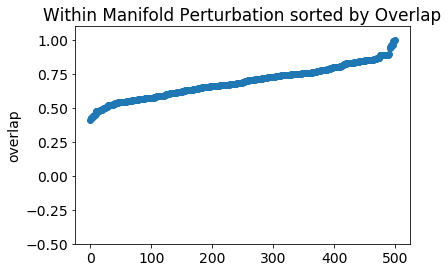

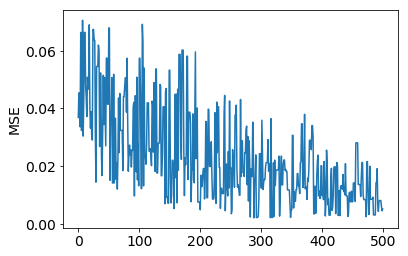

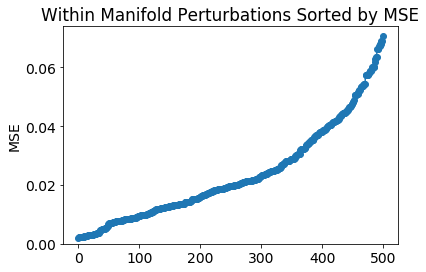

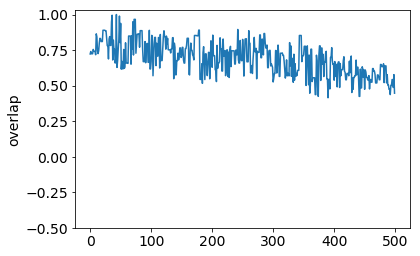

In [16]:

plt.title('Within Manifold Perturbation sorted by Overlap')
plt.plot(np.sort(overlap_list_wm),'o-')
plt.ylim([-0.5,1.1])
plt.ylabel('overlap')
plt.show()



ind = np.argsort(overlap_list_wm)
y = [mean_list_wm[i] for i in ind]
plt.plot(y,'-')
plt.ylim()
plt.ylabel('MSE')
plt.show()

plt.title('Within Manifold Perturbations Sorted by MSE')
plt.plot(np.sort(mean_list_wm),'o-')
plt.ylim(bottom=0)
plt.ylabel('MSE')
plt.show()


ind = np.argsort(mean_list_wm)
y = [overlap_list_wm[i] for i in ind]
plt.plot(y)
plt.ylim(bottom=-0.50)
plt.ylabel('overlap')
plt.show()


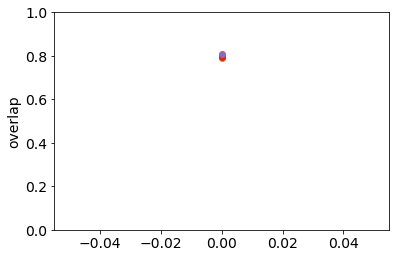

In [17]:
""" Find indices for permutation matrices that overlap by specific amount """

values = [0.8]
epsilon = 0.01
amount = slice(0,5)

overlap_values_wm = []
overlap_indices_wm = []

for val in values:
    
    above = np.where(np.asarray(overlap_list_wm) >= val - epsilon)
    below = np.where(np.asarray(overlap_list_wm) <= val + epsilon)
    ind_range = np.intersect1d(above,below)

    y = [overlap_list_wm[i] for i in ind_range] # all overlap values that match criterion
    
    overlap_values_wm.append(y[amount])
    overlap_indices_wm.append(ind_range[amount])


    
# """ Find indices for permutation matrices that have similar MSE """    

# values = [0.001]
# epsilon = 0.0005
# amount = slice(0,5)

# mse_values_wm = []
# mse_indices_wm = []

# for val in values:
    
#     above = np.where(np.asarray(mean_list_wm) >= val - epsilon)
#     below = np.where(np.asarray(mean_list_wm) <= val + epsilon)
#     ind_range = np.intersect1d(above,below)

#     y = [mean_list_wm[i] for i in ind_range] # all overlap values that match criterion
    
#     mse_values_wm.append(y[amount])
#     mse_indices_wm.append(ind_range[amount])

    

plt.plot(overlap_values_wm,'o-')
plt.ylim([0,1])
plt.ylabel('overlap')
plt.show()


# plt.plot(mse_values_wm,'o-')
# plt.ylim(bottom=0)
# plt.ylabel('MSE')
# plt.show()

In [18]:
overlap_values_wm

[[0.7961808743918894,
  0.7921772240502529,
  0.7991025227101264,
  0.7961808743918894,
  0.8099794637790035]]

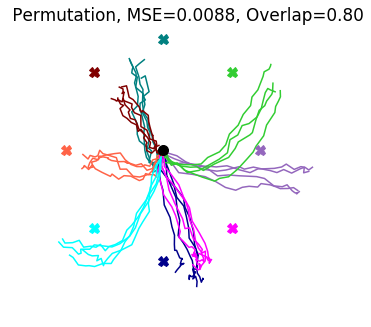

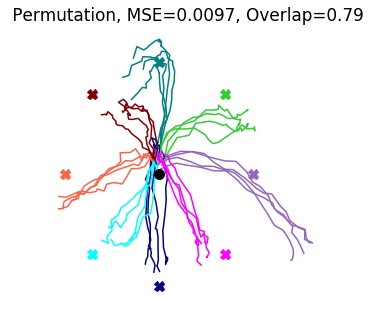

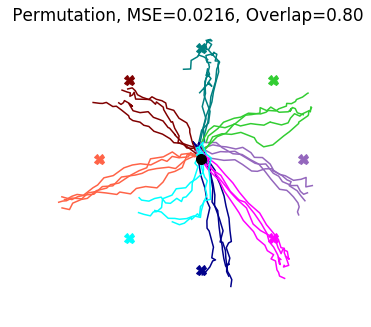

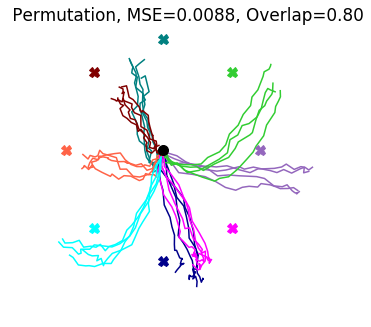

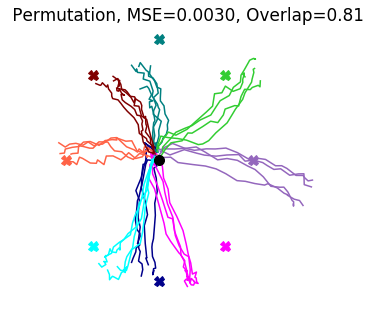

In [19]:
T_wm_list = []

""" arrange by overlap """
for ind,title in zip(np.array(overlap_indices_wm).ravel(),np.asarray(overlap_values_wm).ravel()):

#""" arrange by mse """
#for ind,title in zip(np.array(mse_indices_wm).ravel(),np.asarray(mse_values_wm).ravel()):
    
    T_wm = D @ perm_list_wm[ind] @ C  
    
    T_wm_list.append(T_wm)

    # """ Initialize Test Network """
    net_test = RNN(params)
    net_test.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m)) # keep "nonpermuted" internal matrix
    net_test.set_weights(w_out=T_wm)

    # initialize simulation
    sim_test = Simulation(net_test)

    rflo = RFLO(net_test,apply_to=['w_rec']) # weight_transport doesn't matter here, because we are not learning w_out

    fig = plot_trained_trajectories(sim=sim_test, tasks=[task1,task2,task3,task4,task5,task6,task7,task8],title=' Permutation, MSE={:.4f}, Overlap={:.2f}'.format(mean_list_wm[ind],overlap_list_wm[ind]))

    

# Train W_fb with RFLO

10000it [01:17, 128.26it/s]


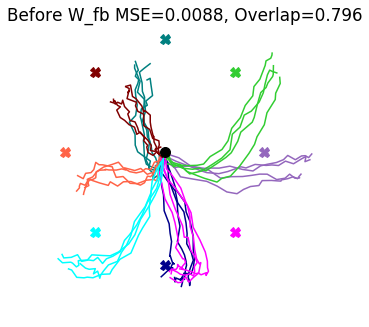

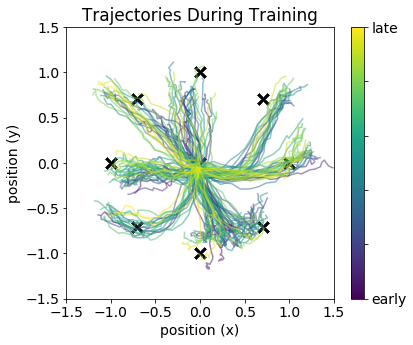

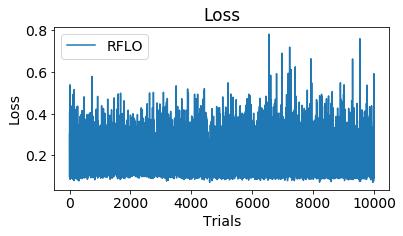

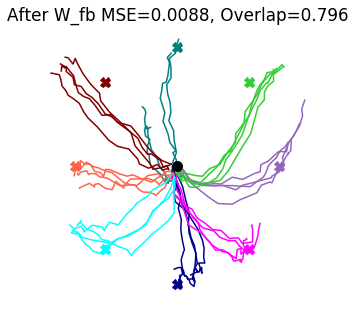

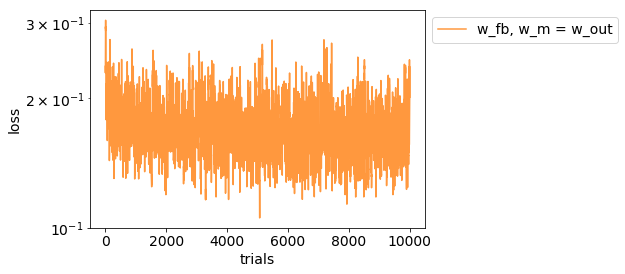

10000it [01:13, 135.26it/s]


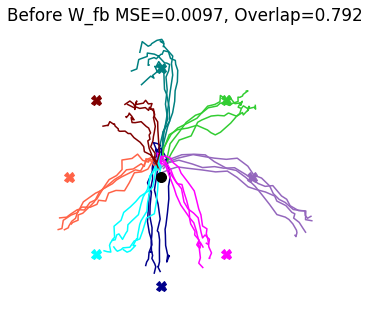

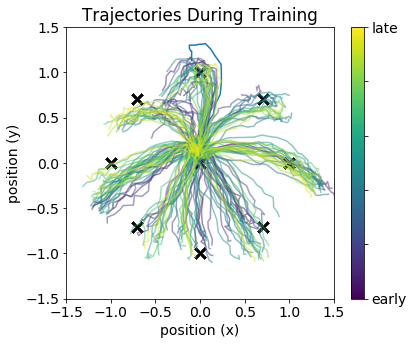

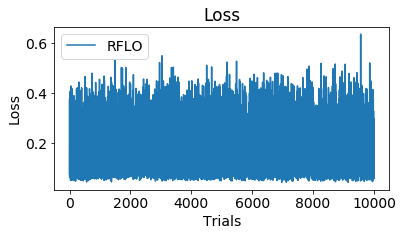

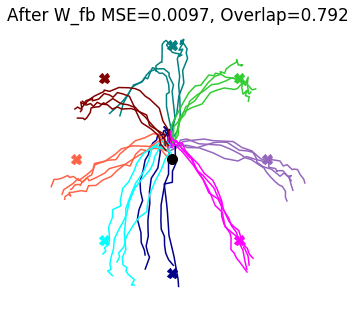

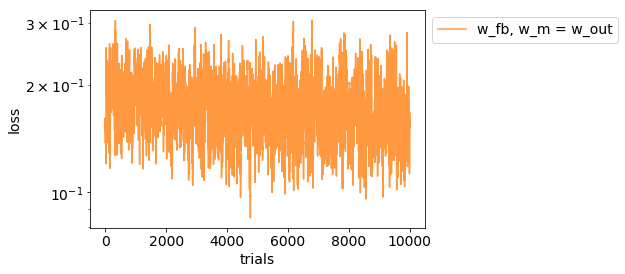

10000it [01:12, 137.31it/s]


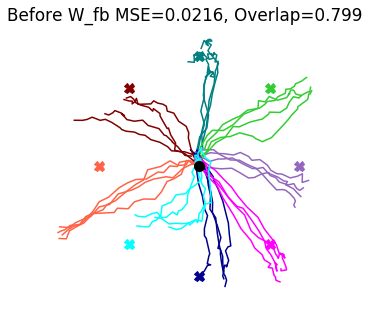

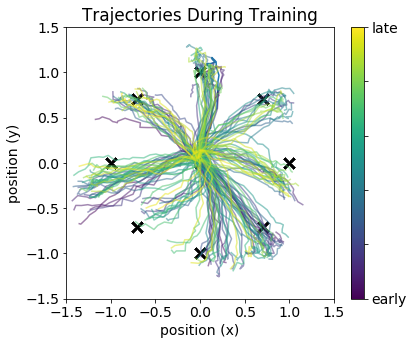

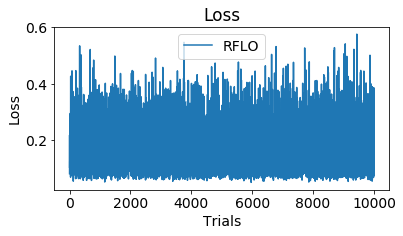

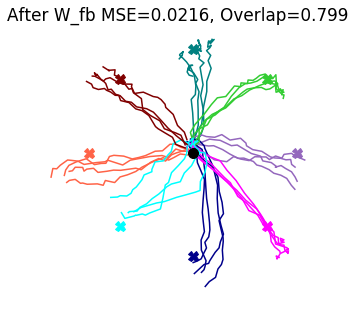

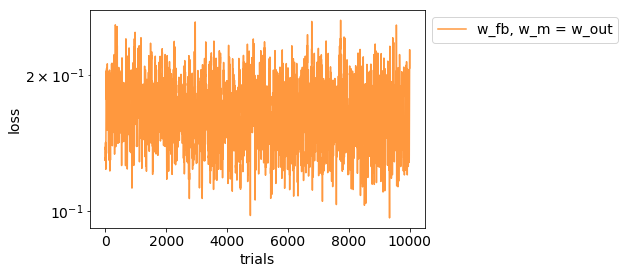

10000it [01:11, 138.93it/s]


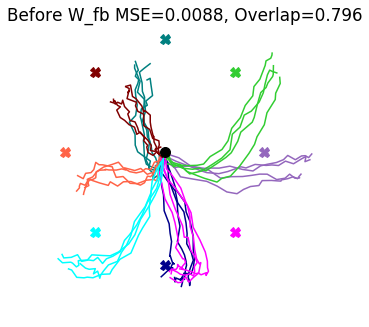

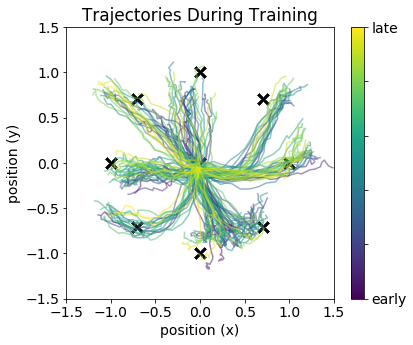

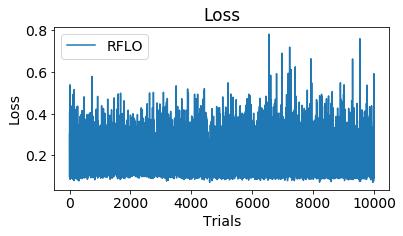

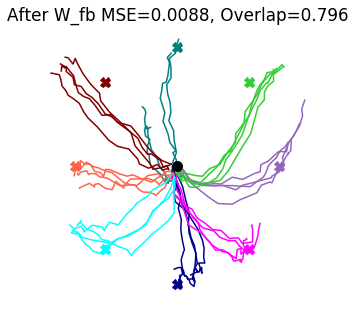

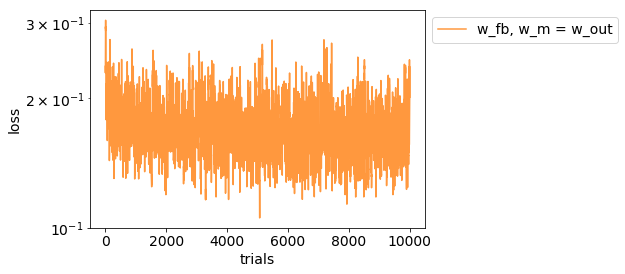

10000it [01:15, 133.12it/s]


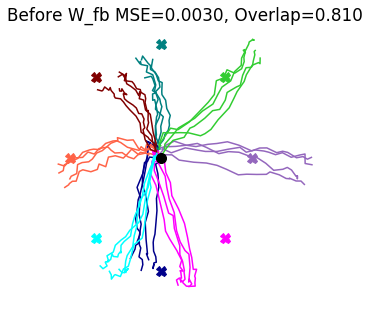

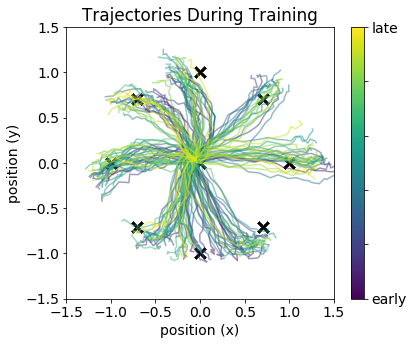

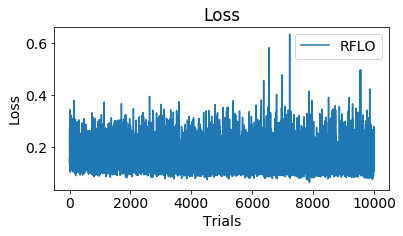

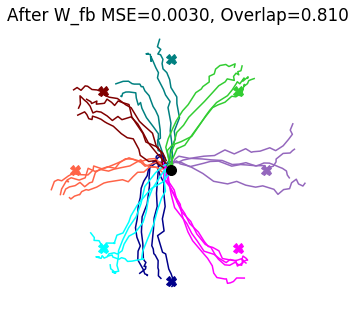

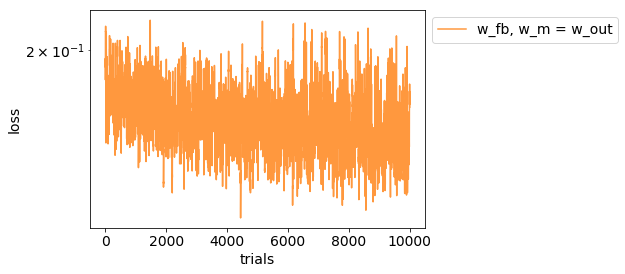

In [20]:
train_dur = 10000


# for T_wm,name,ind in zip([T_wm_mse_max,T_wm_mse_min,T_wm_overlap_max,T_wm_overlap_min],
#                          ['T_wm_mse_max','T_wm_mse_min','T_wm_overlap_max','T_wm_overlap_min'],
#                         [mse_max,mse_min,overlap_max,overlap_min]):
    
#for T_wm,ind in zip(T_wm_list,overlap_indices):

loss_fb_wm = []

""" Keep OVERLAP Controlled """
for T_wm,ind in zip(T_wm_list,np.asarray(overlap_indices_wm).ravel()):

#""" Keep MSE Controlled """
#for T_wm,ind in zip(T_wm_list,np.asarray(mse_indices_wm).ravel()):

    """ Initialize Networks """
    net2 = RNN(params)
    

    
    net2_fb = RNN(params)
    net2_fb.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb))  
    net2_fb.set_weights(w_m=T_wm.T,w_out=T_wm) # use "permuted" internal matrix
    
#     net2_rec = RNN(params)
#     net2_rec.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
#     net2_rec.set_weights(w_out= T_wm, w_m = T_wm.T )



    """ Train w_fb """
    sim2_fb = Simulation(net2_fb)
    
    rflo = RFLO(net2_fb,apply_to=['w_fb'],weight_transport=False,error_fn='distance') # weight_transport doesn't matter here, because we are not learning w_out

    fig = plot_trained_trajectories(sim=sim2_fb, tasks=[task1,task2,task3,task4,task5,task6,task7,task8],title='Before W_fb '+'MSE={:.4f}, Overlap={:.3f}'.format(mean_list_wm[ind],overlap_list_wm[ind]))

    sim2_fb.run_session(n_trials=train_dur, tasks=[task1,task2,task3,task4,task5,task6,task7,task8], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=50)

    fig = plot_trained_trajectories(sim=sim2_fb, tasks=[task1,task2,task3,task4,task5,task6,task7,task8],title='After W_fb '+'MSE={:.4f}, Overlap={:.3f}'.format(mean_list_wm[ind],overlap_list_wm[ind]))
    
    
#     """ Train w_rec """
#     sim2_rec = Simulation(net2_rec)
    
#     rflo = RFLO(net2_rec,apply_to=['w_rec'])

#     fig = plot_trained_trajectories(sim=sim2_rec, tasks=[task1,task2,task3,task4],title='Before, W_rec '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

#     sim2_rec.run_session(n_trials=train_dur, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

#     fig = plot_trained_trajectories(sim=sim2_rec, tasks=[task1,task2,task3,task4],title='After, W_rec '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    plt.show()
    
    

    """ Plot Loss with moving average """

    av0 = uniform_filter1d(np.mean(sim2_fb.session_probes['loss'],axis=1),10)
    plt.plot(av0,label='w_fb, w_m = w_out',color='C1',alpha=0.8)

#     av1 = uniform_filter1d(np.mean(sim2_rec.session_probes['loss'],axis=1),10)
#     plt.plot(av1,label='w_rec, w_m = w_out',color='C8',alpha=0.8)
    
    plt.yscale('log')
    plt.xlabel('trials')
    plt.ylabel('loss')
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
    
    loss_fb_wm.append(av0)


Text(0, 0.5, 'MSE')

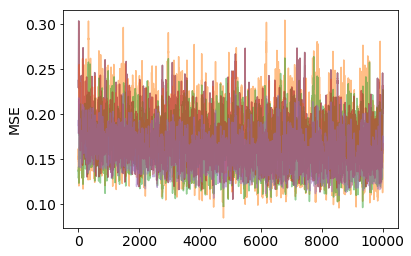

In [21]:
for loss in loss_fb_wm:
    
    plt.plot(loss,alpha=0.5)
    
plt.ylabel('MSE')

Can I do the same thing for an out of manifold perturbation? i.e. with a high overlap?


How do we do this in a systematic manner?

I would like to disassociate two factors (1) the alignment of the old internal model with the new decoder (2) the learning at `w_rec` vs. at `w_fb`

The question of the internal model I think is secondary

I also don't think the conclusions are qualitatively different for a network with 50 neurons vs. with 100 neurons, other than it takes a longer time.



In [22]:
perm_list_om,mean_list_om,overlap_list_om,seeds_om = compare_permutation_matrices(n_comparisons=200,
                                                         params=params,
                                                         net=net1,
                                                         C=C,
                                                         D=D,
                                                         perm_dim=15,
                                                         perturbation='outside_manifold',
                                                         plot=False,
                                                         verbose=False)

10it [00:00, 101.93it/s]
10it [00:00, 137.53it/s]
10it [00:00, 153.56it/s]
10it [00:00, 138.15it/s]
10it [00:00, 153.89it/s]
10it [00:00, 156.75it/s]
10it [00:00, 141.74it/s]
10it [00:00, 148.12it/s]
10it [00:00, 163.98it/s]
10it [00:00, 157.45it/s]
10it [00:00, 137.11it/s]
10it [00:00, 163.37it/s]
10it [00:00, 166.41it/s]
10it [00:00, 149.16it/s]
10it [00:00, 132.61it/s]
10it [00:00, 153.50it/s]
10it [00:00, 161.42it/s]
10it [00:00, 161.21it/s]
10it [00:00, 157.73it/s]
10it [00:00, 146.03it/s]
10it [00:00, 151.73it/s]
10it [00:00, 165.94it/s]
10it [00:00, 157.09it/s]
10it [00:00, 161.10it/s]
10it [00:00, 152.06it/s]
10it [00:00, 160.16it/s]
10it [00:00, 154.30it/s]
10it [00:00, 158.43it/s]
10it [00:00, 154.13it/s]
10it [00:00, 169.37it/s]
10it [00:00, 150.81it/s]
10it [00:00, 162.06it/s]
10it [00:00, 164.50it/s]
10it [00:00, 146.13it/s]
10it [00:00, 159.96it/s]
10it [00:00, 154.13it/s]
10it [00:00, 160.76it/s]
10it [00:00, 162.30it/s]
10it [00:00, 143.17it/s]
10it [00:00, 166.09it/s]


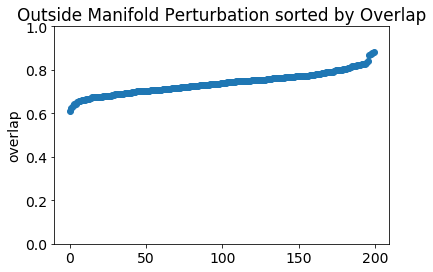

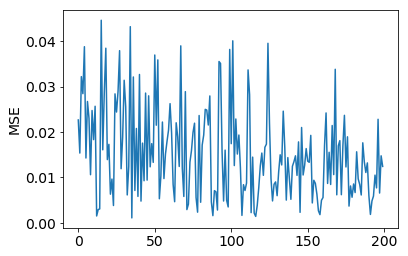

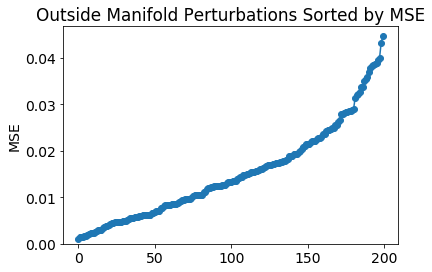

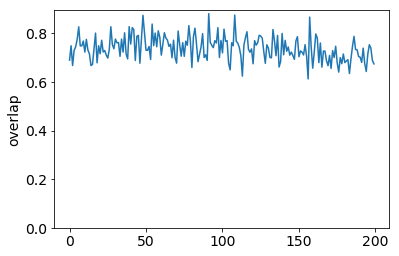

In [23]:

plt.title('Outside Manifold Perturbation sorted by Overlap')
plt.plot(np.sort(overlap_list_om),'o-')
plt.ylim([0,1])
plt.ylabel('overlap')
plt.show()



ind = np.argsort(overlap_list_om)
y = [mean_list_om[i] for i in ind]
plt.plot(y,'-')
plt.ylim()
plt.ylabel('MSE')
plt.show()

plt.title('Outside Manifold Perturbations Sorted by MSE')
plt.plot(np.sort(mean_list_om),'o-')
plt.ylim(bottom=0)
plt.ylabel('MSE')
plt.show()


ind = np.argsort(mean_list_om)
y = [overlap_list_om[i] for i in ind]
plt.plot(y)
plt.ylim(bottom=0)
plt.ylabel('overlap')
plt.show()


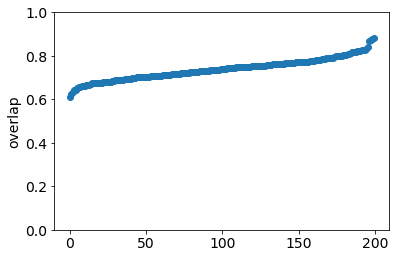

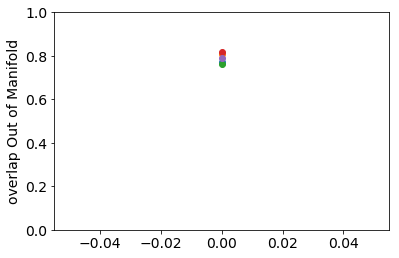

In [24]:


plt.title('')
plt.plot(np.sort(overlap_list_om),'o-')
plt.ylim([0,1])
plt.ylabel('overlap')
plt.show()




""" Find indices for permutation matrices that overlap by specific amount """

values = [0.8]
epsilon = 0.04
amount = slice(0,5)

overlap_values_om = []
overlap_indices_om = []

for val in values:
    
    
    above = np.where(np.asarray(overlap_list_om) >= val - epsilon)
    below = np.where(np.asarray(overlap_list_om) <= val + epsilon)
    ind_range = np.intersect1d(above,below)

    y = [overlap_list_om[i] for i in ind_range] # all overlap values that match criterion
    
    overlap_values_om.append(y[amount])
    overlap_indices_om.append(ind_range[amount])

    

plt.plot(overlap_values_om,'o-')
plt.ylim([0,1])
plt.ylabel('overlap Out of Manifold')
plt.show()

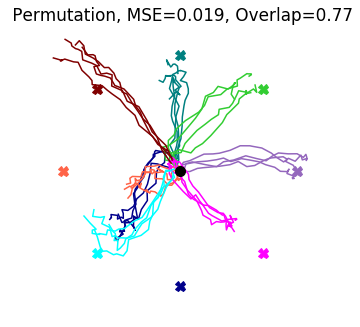

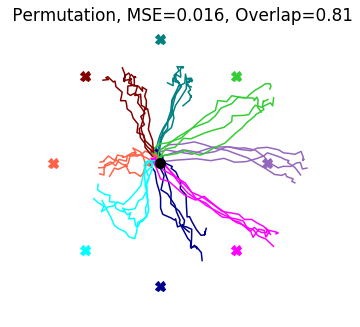

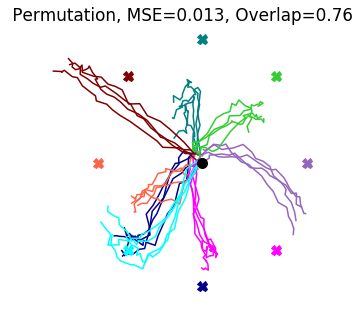

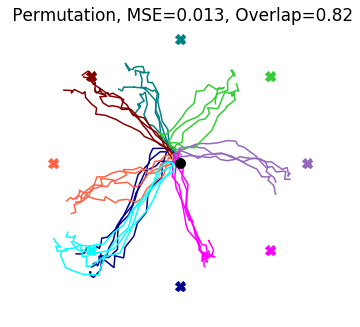

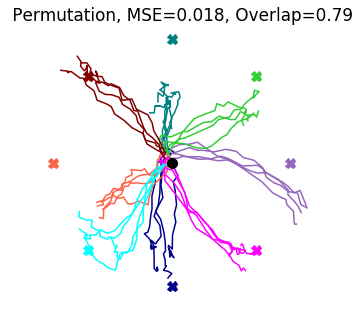

In [25]:
T_om_list = []

for ind,title in zip(np.array(overlap_indices_om).ravel(),np.asarray(overlap_values_om).ravel()):
    T_om = D @ C @ perm_list_om[ind]  
    
    T_om_list.append(T_om)

    # """ Initialize Test Network """
    net_test = RNN(params)
    net_test.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m)) # keep "nonpermuted" internal matrix
    net_test.set_weights(w_out=T_om)

    # initialize simulation
    sim_test = Simulation(net_test)

    rflo = RFLO(net_test,apply_to=['w_rec']) # weight_transport doesn't matter here, because we are not learning w_out

    fig = plot_trained_trajectories(sim=sim_test, tasks=[task1,task2,task3,task4,task5,task6,task7,task8],title=' Permutation, MSE={:.3f}, Overlap={:.2f}'.format(mean_list_om[ind],overlap_list_om[ind]))

    

10000it [01:23, 120.33it/s]


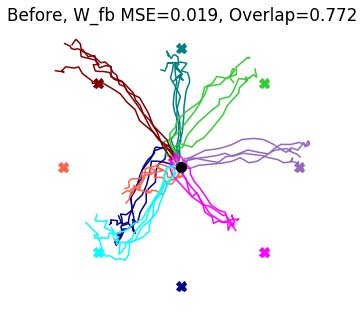

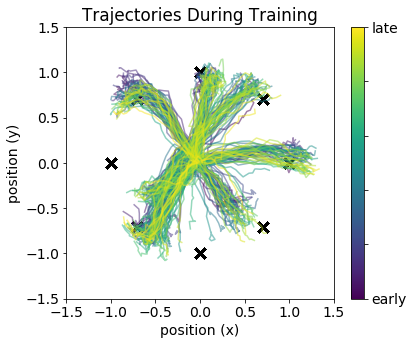

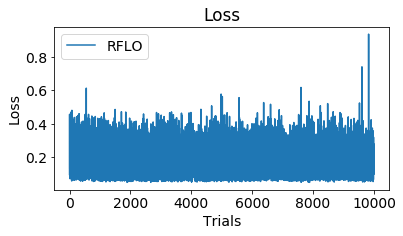

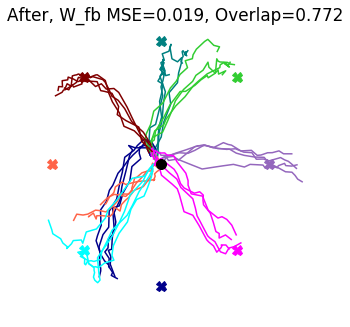

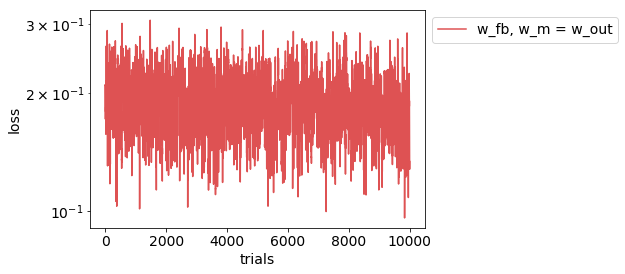

10000it [01:20, 124.32it/s]


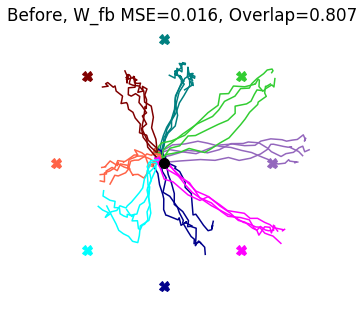

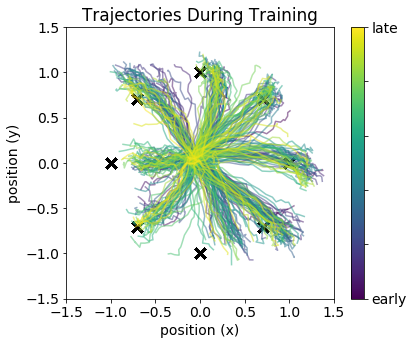

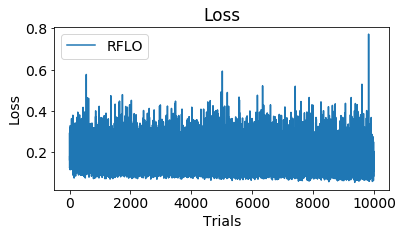

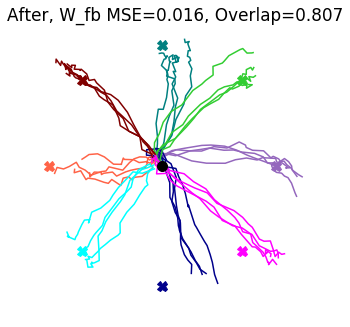

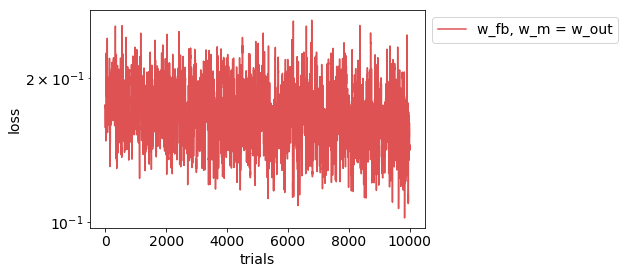

10000it [01:22, 121.18it/s]


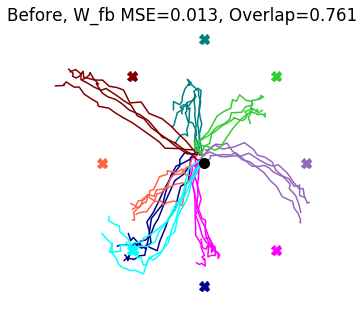

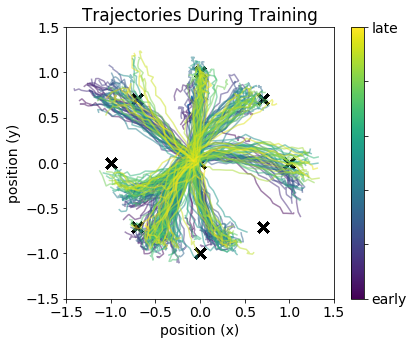

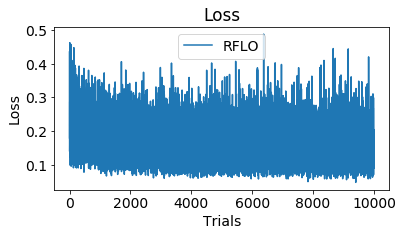

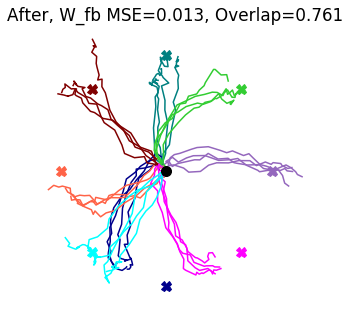

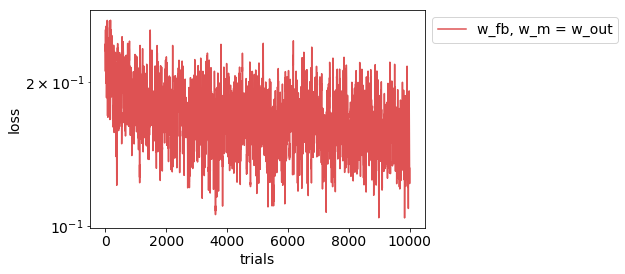

10000it [01:18, 123.49it/s]


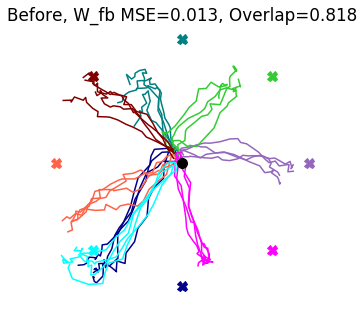

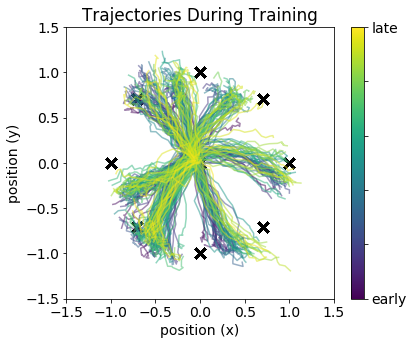

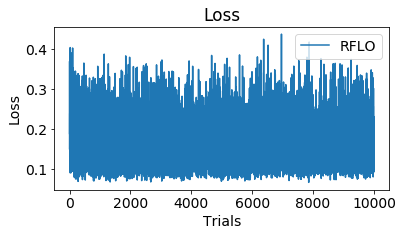

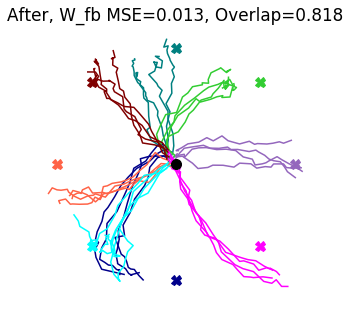

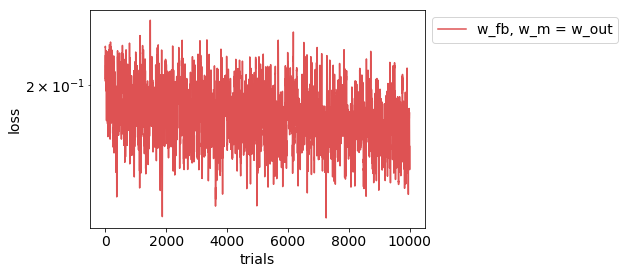

10000it [01:18, 126.90it/s]


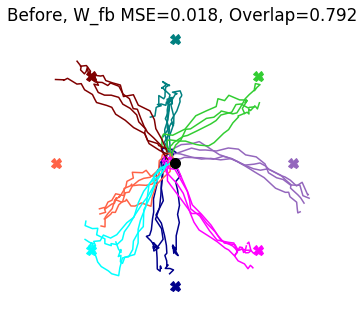

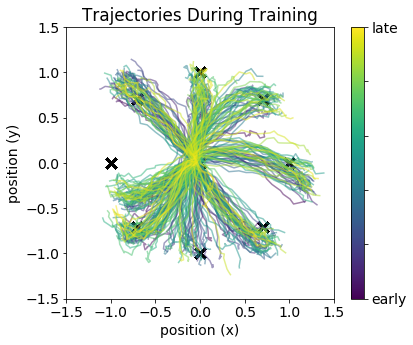

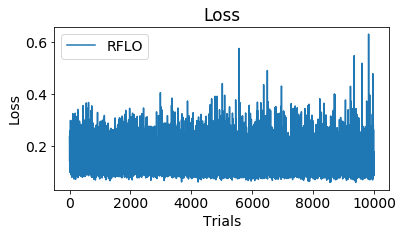

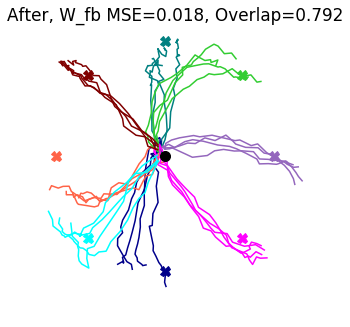

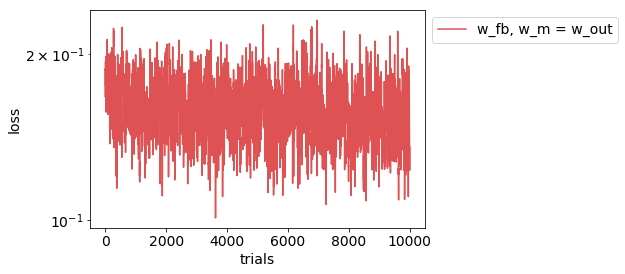

In [26]:
train_dur = 10000

loss_fb_om = []

""" Keep OVERLAP Controlled """
for T_om,ind in zip(T_om_list,np.asarray(overlap_indices_om).ravel()):
    
    net3_fb = RNN(params)
    net3_fb.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net3_fb.set_weights(w_out= T_om, w_m = T_om.T )
    
    
#     net3_rec = RNN(params)
#     net3_rec.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
#     net3_rec.set_weights(w_out= T_om, w_m = T_om.T )

    # initialize simulation
    
    """ Train FB weights alone """
    sim3_fb = Simulation(net3_fb)
    
    rflo = RFLO(net3_fb,apply_to=['w_fb'],error_fn='distance')

    fig = plot_trained_trajectories(sim=sim3_fb, tasks=[task1,task2,task3,task4,task5,task6,task7,task8],title='Before, W_fb '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list_om[ind],overlap_list_om[ind]))

    sim3_fb.run_session(n_trials=train_dur, tasks=[task1,task2,task3,task4,task5,task6,task7,task8], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

    fig = plot_trained_trajectories(sim=sim3_fb, tasks=[task1,task2,task3,task4,task5,task6,task7,task8],title='After, W_fb '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list_om[ind],overlap_list_om[ind]))
    
    plt.show()
    
    
#     """ Train w_rec """
#     sim3_rec = Simulation(net3_rec)
    
#     rflo = RFLO(net3_rec,apply_to=['w_rec'])

#     fig = plot_trained_trajectories(sim=sim3_rec, tasks=[task1,task2,task3,task4],title='Before, W_rec '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list_om[ind]))

#     sim3_rec.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

#     fig = plot_trained_trajectories(sim=sim3_rec, tasks=[task1,task2,task3,task4],title='After, W_rec '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list_om[ind]))
    
#     plt.show()
    
    

    """ Plot Loss with moving average """
    av0 = uniform_filter1d(np.mean(sim3_fb.session_probes['loss'],axis=1),10)
    plt.plot(av0,label='w_fb, w_m = w_out',color='C3',alpha=0.8)
    
#     av1 = uniform_filter1d(np.mean(sim3_rec.session_probes['loss'],axis=1),10)
#     plt.plot(av1,label='w_rec, w_m = w_out',color='k',alpha=0.8)

    loss_fb_om.append(av0)
   
    plt.yscale('log')
    plt.xlabel('trials')
    plt.ylabel('loss')
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()




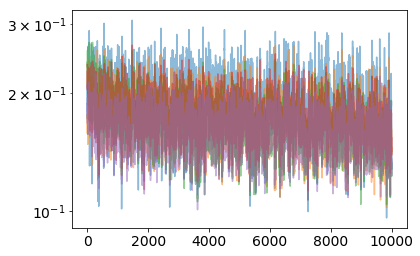

In [27]:

#plt.plot(np.mean(np.asarray(loss_fb_wm),0))

for loss in loss_fb_om:
    plt.plot(loss,alpha=0.5)
    
plt.yscale('log')

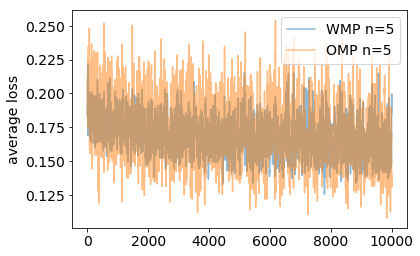

In [29]:
plt.plot(np.mean(np.asarray(loss_fb_wm),0),label='WMP n={}'.format(len(loss_fb_wm)),alpha=0.5)
plt.plot(np.mean(np.asarray(loss_fb_om),0),label='OMP n={}'.format(len(loss_fb_om)),alpha=0.5)
plt.legend()
plt.ylabel('average loss')
plt.show()

## Find best and worst OUTSIDE manifold permutations

10it [00:00, 478.38it/s]
10it [00:00, 408.24it/s]
10it [00:00, 512.56it/s]
10it [00:00, 601.51it/s]
10it [00:00, 644.26it/s]
10it [00:00, 744.32it/s]
10it [00:00, 569.74it/s]
10it [00:00, 519.75it/s]
10it [00:00, 772.26it/s]
10it [00:00, 420.75it/s]
10it [00:00, 490.37it/s]
10it [00:00, 637.35it/s]
10it [00:00, 586.58it/s]
10it [00:00, 643.05it/s]
10it [00:00, 771.72it/s]
10it [00:00, 732.92it/s]
10it [00:00, 618.42it/s]
10it [00:00, 549.67it/s]
10it [00:00, 614.03it/s]
10it [00:00, 701.46it/s]
10it [00:00, 669.35it/s]
10it [00:00, 522.03it/s]
10it [00:00, 668.40it/s]
10it [00:00, 814.21it/s]
10it [00:00, 645.59it/s]
10it [00:00, 609.68it/s]
10it [00:00, 765.57it/s]
10it [00:00, 672.71it/s]
10it [00:00, 697.59it/s]
10it [00:00, 576.84it/s]
10it [00:00, 637.09it/s]
10it [00:00, 658.59it/s]
10it [00:00, 608.65it/s]
10it [00:00, 622.67it/s]
10it [00:00, 760.91it/s]
10it [00:00, 622.36it/s]
10it [00:00, 706.75it/s]
10it [00:00, 468.12it/s]
10it [00:00, 525.98it/s]
10it [00:00, 539.43it/s]


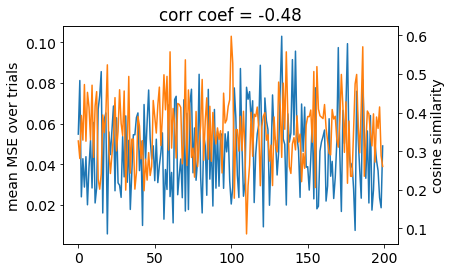

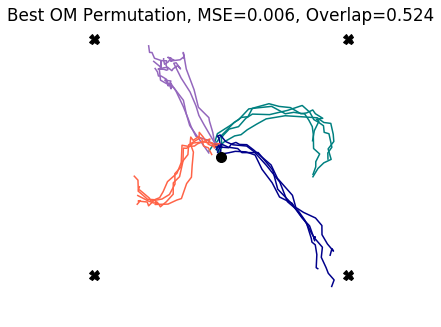

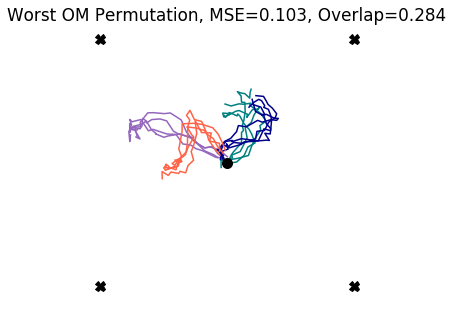

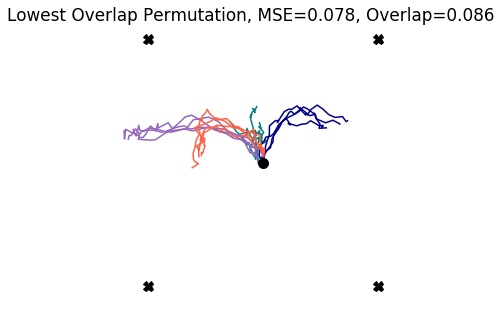

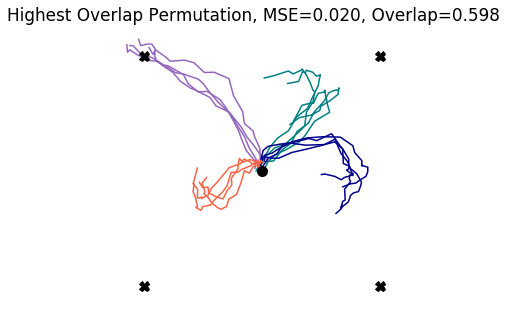

In [41]:
perm_list,mean_list,overlap_list,seeds = compare_permutation_matrices(n_comparisons=200,
                                                         params=params,
                                                         net=net1,
                                                         C=C,
                                                         D=D,
                                                         perm_dim=30,
                                                         perturbation='outside_manifold',
                                                         plot=False,
                                                         verbose=False)



mse_min = np.argmin(mean_list)
mse_max = np.argmax(mean_list)

overlap_min = np.argmin(overlap_list)
overlap_max = np.argmax(overlap_list)

# plot trajectories for best and worst permutations
corr =np.corrcoef(np.asarray(mean_list),np.asarray(overlap_list))[0,1]

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(mean_list,'C0')
ax2.plot(overlap_list,'C1')
ax1.set_ylabel('mean MSE over trials')
ax2.set_ylabel('cosine similarity')
ax1.set_title('corr coef = {:.2f}'.format(corr))
plt.show()


for ind,title in zip([mse_min,mse_max],['Best OM','Worst OM']):
    T_om = D @ C @ perm_list[ind]      

    # """ Initialize Test Network """
    net_test = RNN(params)
    net_test.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net_test.set_weights(w_out=T_om)

    # initialize simulation
    sim_test = Simulation(net_test)


    fig = plot_trained_trajectories(sim=sim_test, tasks=[task1,task2,task3,task4],title=title+' Permutation, MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    
    
for ind,title in zip([overlap_min,overlap_max],['Lowest Overlap','Highest Overlap']):
    T_om = D @ C @ perm_list[ind] 

    # """ Initialize Test Network """
    net_test = RNN(params)
    net_test.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net_test.set_weights(w_out=T_om)

    # initialize simulation
    sim_test = Simulation(net_test)


    fig = plot_trained_trajectories(sim=sim_test, tasks=[task1,task2,task3,task4],title=title+' Permutation, MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    
#""" Find best MSE """    
#T_om = D @ C @ perm_list[mse_min] 
""" Find best Overlap """    
T_om_overlap_max = D @ C @ perm_list[overlap_max]
T_om_overlap_min = D @ C @ perm_list[overlap_min]
T_om_mse_max = D @ C @ perm_list[mse_max]
T_om_mse_min = D @ C @ perm_list[mse_min]

    

5000it [00:09, 528.61it/s]
5000it [00:09, 510.72it/s]
5000it [00:11, 430.49it/s]
5000it [00:12, 402.21it/s]


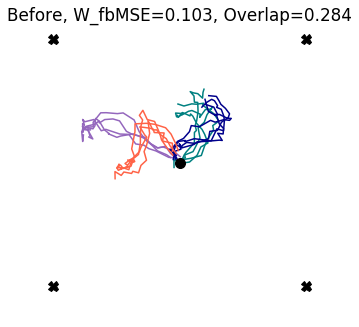

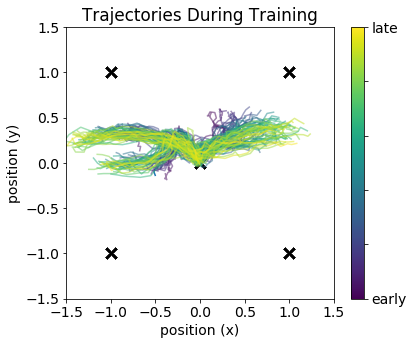

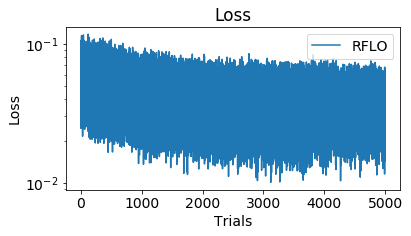

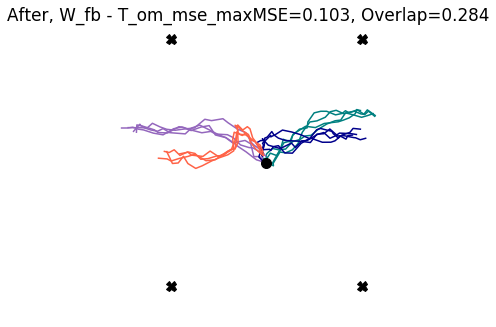

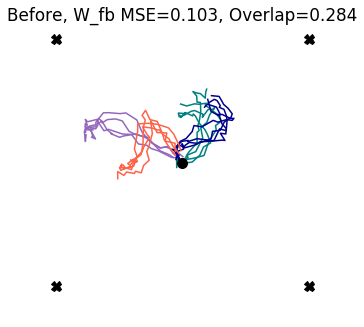

...

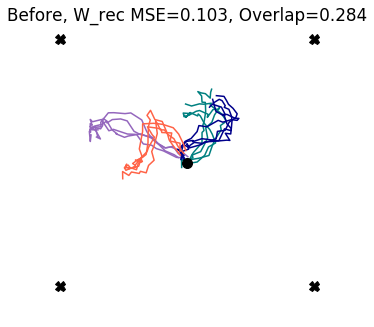

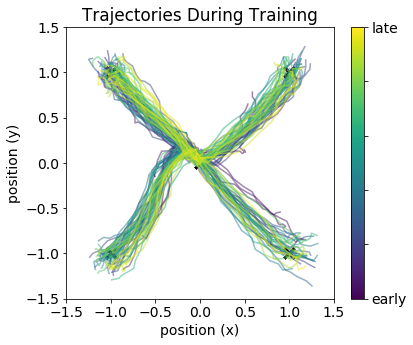

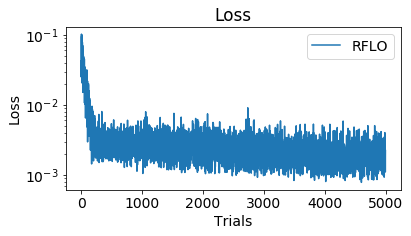

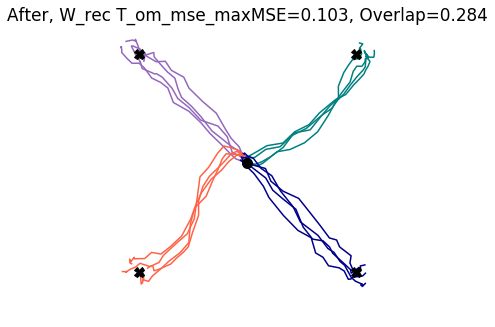

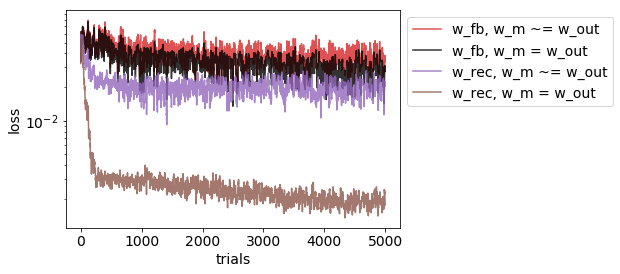

5000it [00:09, 521.91it/s]
5000it [00:10, 470.35it/s]
5000it [00:11, 421.80it/s]
5000it [00:12, 394.89it/s]


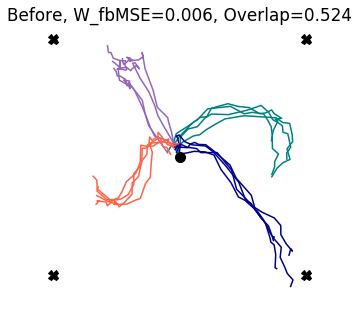

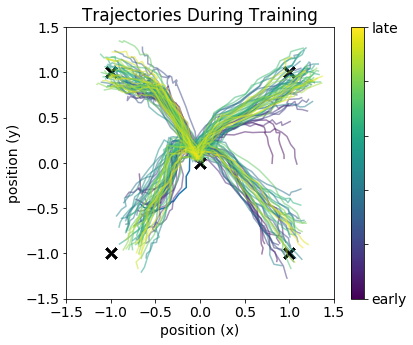

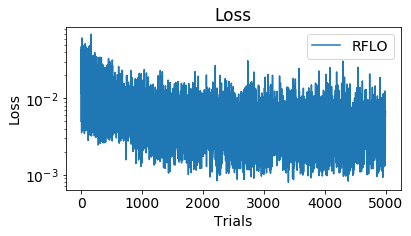

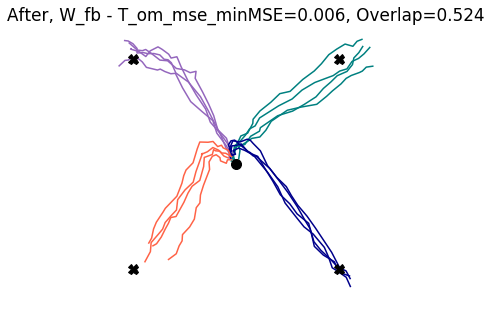

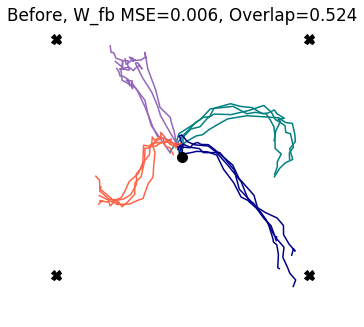

...

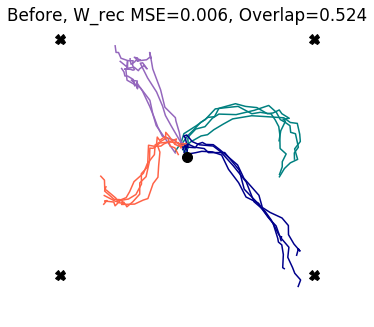

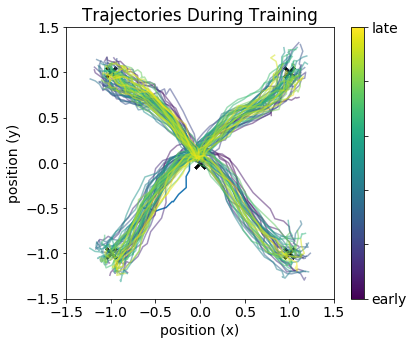

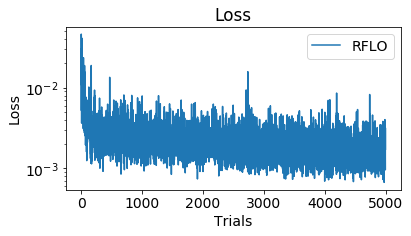

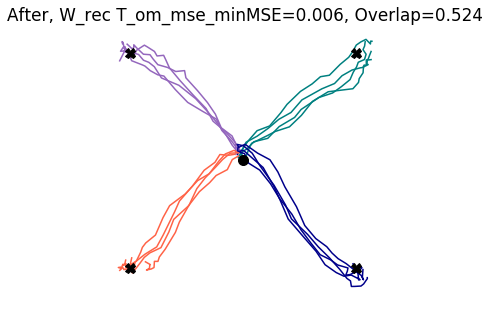

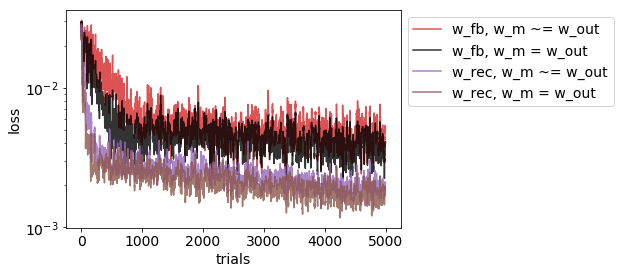

5000it [00:13, 376.16it/s]
5000it [00:13, 380.99it/s]
5000it [00:13, 364.08it/s]
5000it [00:13, 370.69it/s]


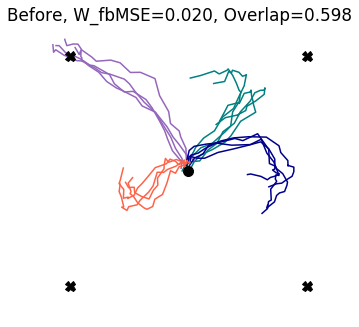

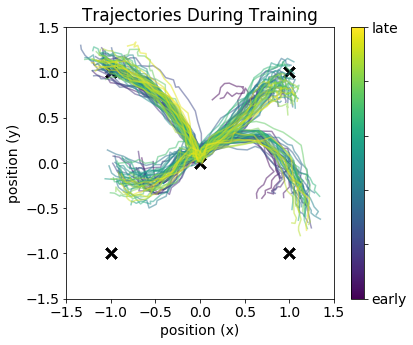

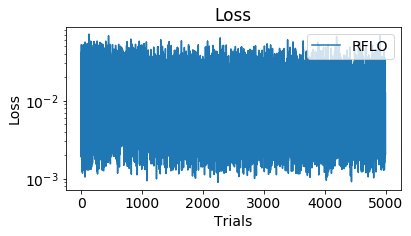

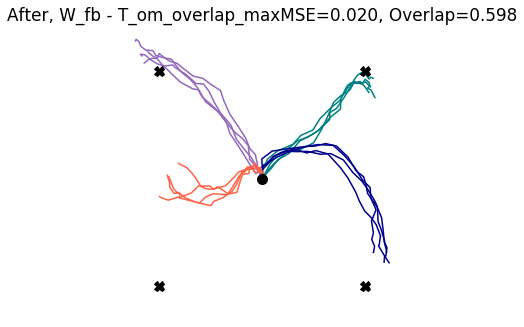

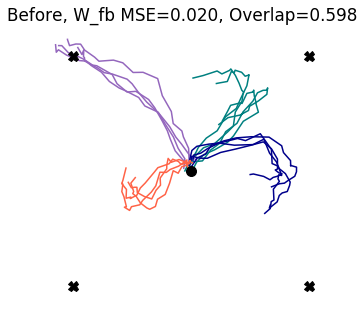

...

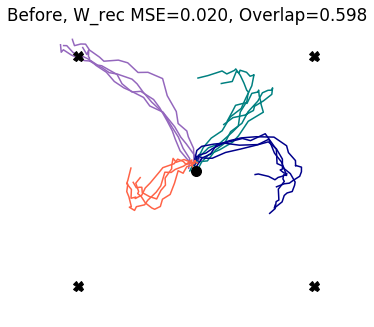

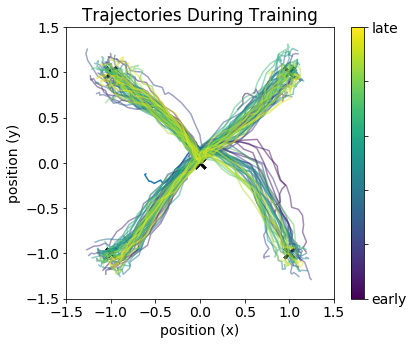

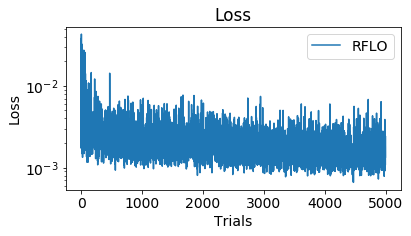

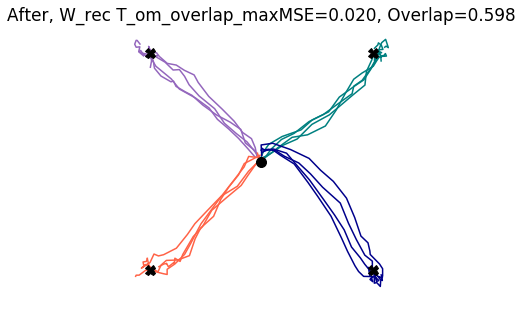

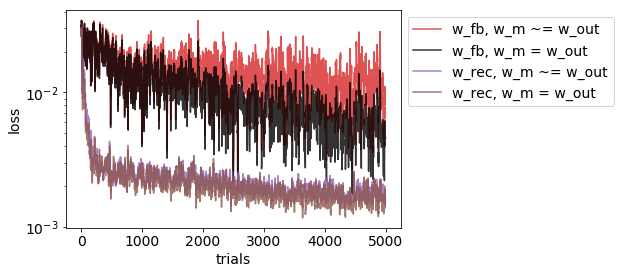

5000it [00:11, 447.85it/s]
5000it [00:10, 458.10it/s]
5000it [00:14, 333.92it/s]
5000it [00:20, 247.03it/s]


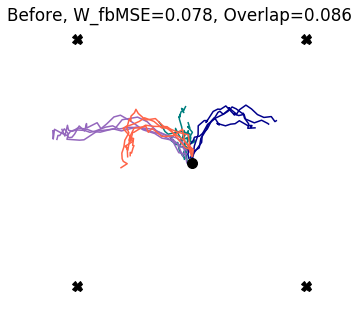

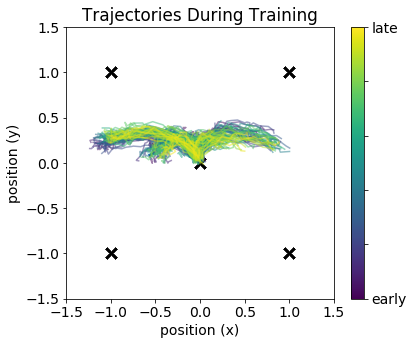

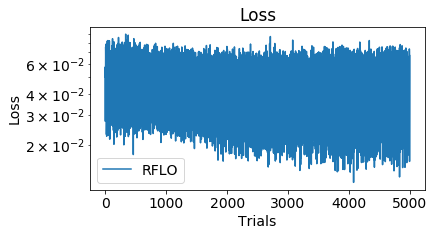

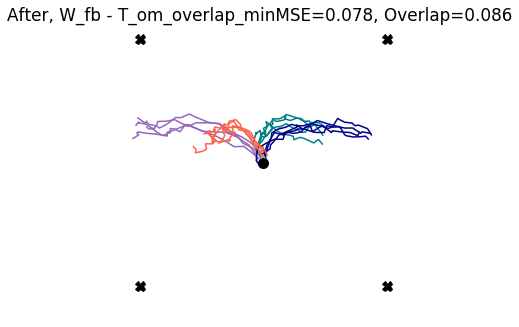

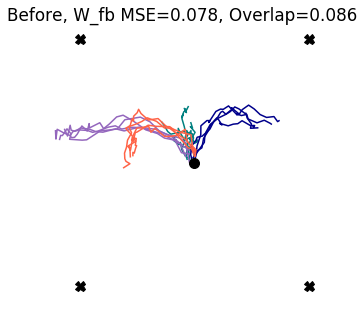

...

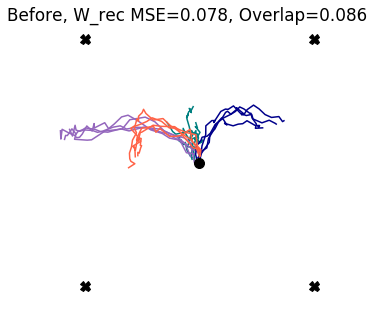

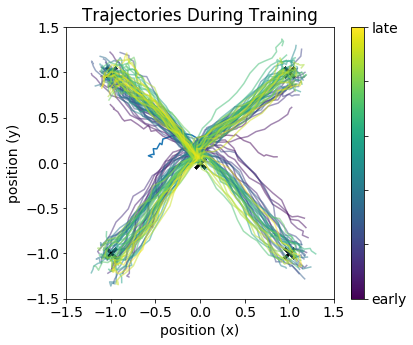

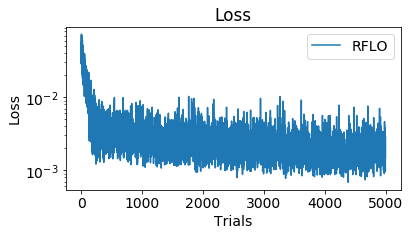

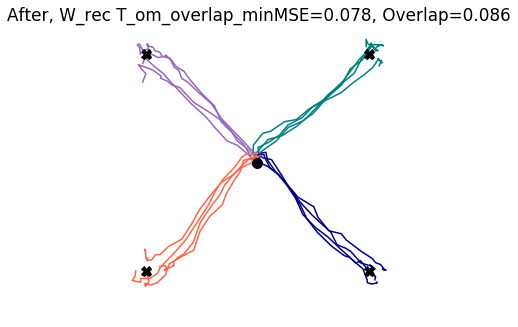

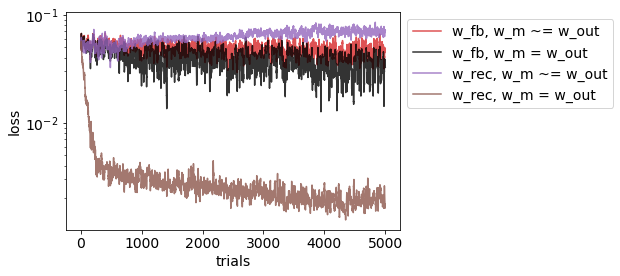

In [42]:

for T_om,name,ind in zip([T_om_mse_max,T_om_mse_min,T_om_overlap_max,T_om_overlap_min],
                         ['T_om_mse_max','T_om_mse_min','T_om_overlap_max','T_om_overlap_min'],
                         [mse_max,mse_min,overlap_max,overlap_min]):


    net3 = RNN(params)
    net3.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net3.set_weights(w_out= T_om )
    
    net3_ctrl = RNN(params)
    net3_ctrl.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net3_ctrl.set_weights(w_out= T_om, w_m = T_om.T )
    
    net3_rec = RNN(params)
    net3_rec.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net3_rec.set_weights(w_out= T_om )
    
    net3_rec_ctrl = RNN(params)
    net3_rec_ctrl.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net3_rec_ctrl.set_weights(w_out= T_om, w_m = T_om.T )

    # initialize simulation
    sim3 = Simulation(net3)

    rflo = RFLO(net3,apply_to=['w_fb']) 

    fig = plot_trained_trajectories(sim=sim3, tasks=[task1,task2,task3,task4],title='Before, W_fb'+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim3.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

    fig = plot_trained_trajectories(sim=sim3, tasks=[task1,task2,task3,task4],title='After, W_fb - '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    
    """ Control Experiment """
    sim3_ctrl = Simulation(net3_ctrl)
    
    rflo = RFLO(net3_ctrl,apply_to=['w_fb'])

    fig = plot_trained_trajectories(sim=sim3_ctrl, tasks=[task1,task2,task3,task4],title='Before, W_fb '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim3_ctrl.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

    fig = plot_trained_trajectories(sim=sim3_ctrl, tasks=[task1,task2,task3,task4],title='After, W_fb '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    """ train w_rec """
    
    sim3_rec = Simulation(net3_rec)

    rflo = RFLO(net3_rec,apply_to=['w_rec']) 

    fig = plot_trained_trajectories(sim=sim3_rec, tasks=[task1,task2,task3,task4],title='Before, W_rec '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim3_rec.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

    fig = plot_trained_trajectories(sim=sim3_rec, tasks=[task1,task2,task3,task4],title='After, W_rec '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    
    """ Control Experiment with w_rec """
    sim3_rec_ctrl = Simulation(net3_rec_ctrl)
    
    rflo = RFLO(net3_rec_ctrl,apply_to=['w_rec'])

    fig = plot_trained_trajectories(sim=sim3_rec_ctrl, tasks=[task1,task2,task3,task4],title='Before, W_rec '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim3_rec_ctrl.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

    fig = plot_trained_trajectories(sim=sim3_rec_ctrl, tasks=[task1,task2,task3,task4],title='After, W_rec '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    plt.show()
    
    

    """ Plot Loss with moving average """
    av0 = uniform_filter1d(np.mean(sim3.session_probes['loss'],axis=1),10)
    plt.plot(av0,label='w_fb, w_m ~= w_out',color='C3',alpha=0.8)
    av1 = uniform_filter1d(np.mean(sim3_ctrl.session_probes['loss'],axis=1),10)
    plt.plot(av1,label='w_fb, w_m = w_out',color='k',alpha=0.8)
    av2 = uniform_filter1d(np.mean(sim3_rec.session_probes['loss'],axis=1),10)
    plt.plot(av2,label='w_rec, w_m ~= w_out',color='C4',alpha=0.8)
    av3 = uniform_filter1d(np.mean(sim3_rec_ctrl.session_probes['loss'],axis=1),10)
    plt.plot(av3,label='w_rec, w_m = w_out',color='C5',alpha=0.8)
    plt.yscale('log')
    plt.xlabel('trials')
    plt.ylabel('loss')
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()




# Choose Lowest Overlap, Within Manifold

10it [00:00, 772.56it/s]
10it [00:00, 870.78it/s]
10it [00:00, 964.43it/s]
10it [00:00, 699.34it/s]
10it [00:00, 448.19it/s]
10it [00:00, 455.46it/s]
10it [00:00, 534.73it/s]
10it [00:00, 701.32it/s]
10it [00:00, 720.73it/s]
10it [00:00, 457.68it/s]
10it [00:00, 552.51it/s]
10it [00:00, 510.78it/s]
10it [00:00, 841.45it/s]
10it [00:00, 529.24it/s]
10it [00:00, 708.92it/s]
10it [00:00, 733.63it/s]
10it [00:00, 474.09it/s]
10it [00:00, 914.83it/s]
10it [00:00, 635.00it/s]
10it [00:00, 480.37it/s]
10it [00:00, 419.73it/s]
10it [00:00, 469.00it/s]
10it [00:00, 542.83it/s]
10it [00:00, 510.88it/s]
10it [00:00, 641.36it/s]
10it [00:00, 679.61it/s]
10it [00:00, 524.77it/s]
10it [00:00, 591.12it/s]
10it [00:00, 654.33it/s]
10it [00:00, 508.63it/s]
10it [00:00, 558.85it/s]
10it [00:00, 560.70it/s]
10it [00:00, 483.28it/s]
10it [00:00, 724.84it/s]
10it [00:00, 539.75it/s]
10it [00:00, 704.52it/s]
10it [00:00, 547.95it/s]
10it [00:00, 495.14it/s]
10it [00:00, 708.17it/s]
10it [00:00, 674.62it/s]


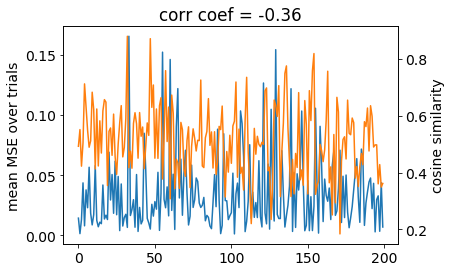

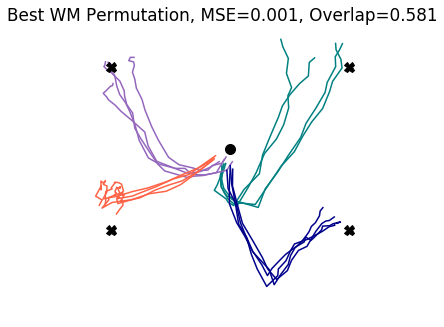

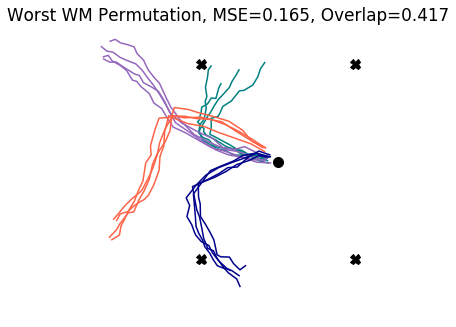

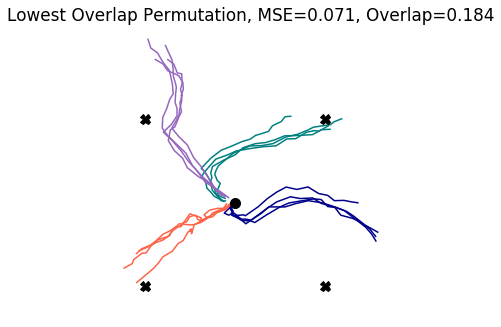

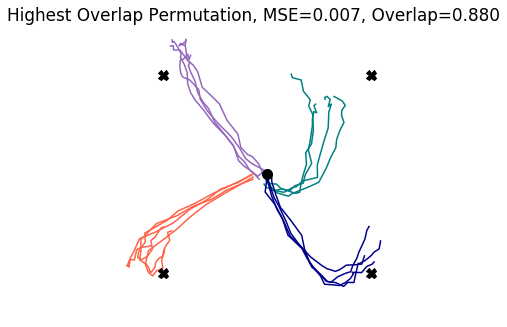

In [52]:
perm_list,mean_list,overlap_list,seeds = compare_permutation_matrices(n_comparisons=200,
                                                         params=params,
                                                         net=net1,
                                                         C=C,
                                                         D=D,
                                                         perm_dim=8,
                                                         perturbation='within_manifold',
                                                         plot=False,
                                                         verbose=False)



mse_min = np.argmin(mean_list)
mse_max = np.argmax(mean_list)

overlap_min = np.argmin(overlap_list)
overlap_max = np.argmax(overlap_list)

# plot trajectories for best and worst permutations
corr =np.corrcoef(np.asarray(mean_list),np.asarray(overlap_list))[0,1]

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(mean_list,'C0')
ax2.plot(overlap_list,'C1')
ax1.set_ylabel('mean MSE over trials')
ax2.set_ylabel('cosine similarity')
ax1.set_title('corr coef = {:.2f}'.format(corr))
plt.show()


for ind,title in zip([mse_min,mse_max],['Best WM','Worst WM']):
    T_wm = D @ perm_list[ind] @ C       

    # """ Initialize Test Network """
    net_test = RNN(params)
    net_test.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m)) # keep "nonpermuted" internal matrix
    net_test.set_weights(w_out=T_wm)

    # initialize simulation
    sim_test = Simulation(net_test)

    rflo = RFLO(net_test,apply_to=['w_rec']) # weight_transport doesn't matter here, because we are not learning w_out

    fig = plot_trained_trajectories(sim=sim_test, tasks=[task1,task2,task3,task4],title=title+' Permutation, MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    
for ind,title in zip([overlap_min,overlap_max],['Lowest Overlap','Highest Overlap']):
    T_wm = D @ perm_list[ind] @ C       

    # """ Initialize Test Network """
    net_test = RNN(params)
    net_test.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m)) # keep "nonpermuted" internal matrix
    net_test.set_weights(w_out=T_wm)

    # initialize simulation
    sim_test = Simulation(net_test)

    rflo = RFLO(net_test,apply_to=['w_rec']) # weight_transport doesn't matter here, because we are not learning w_out

    fig = plot_trained_trajectories(sim=sim_test, tasks=[task1,task2,task3,task4],title=title+' Permutation, MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    
""" Find best MSE, set at T_wm """    
T_wm_overlap_max = D @ perm_list[overlap_max] @ C   
T_wm_overlap_min = D @ perm_list[overlap_min] @ C  
T_wm_mse_max = D @ perm_list[mse_max] @ C  
T_wm_mse_min = D @ perm_list[mse_min] @ C  



In [58]:
overlap_ind = np.argsort(overlap_list)
overlap_ind

overlap_sorted = [overlap_list[overlap_ind[i]] for i in range(len(overlap_ind))]

T_wm_overlap_list = [D @ perm_list[overlap_ind[i]] @ C  for i in range(4)]
names = [str(overlap_ind[i])   for i in range(4)]

In [55]:
len(T_wm_overlap_list)

4

# Train W_fb with RFLO

5000it [00:09, 519.11it/s]
5000it [00:12, 412.55it/s]
5000it [00:16, 304.48it/s]
5000it [00:17, 284.88it/s]


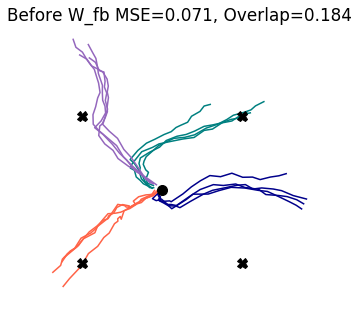

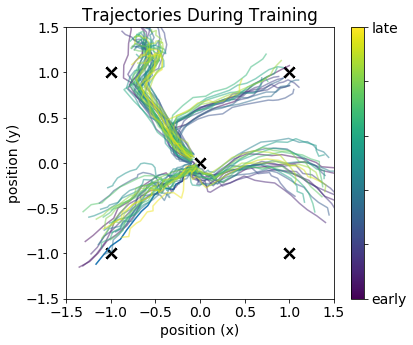

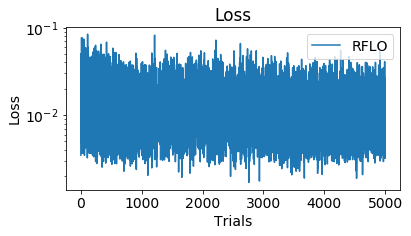

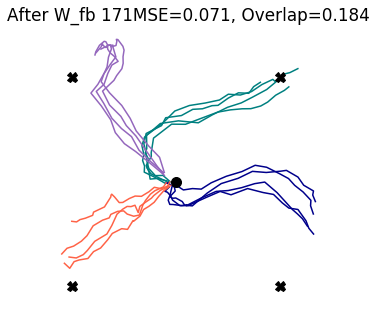

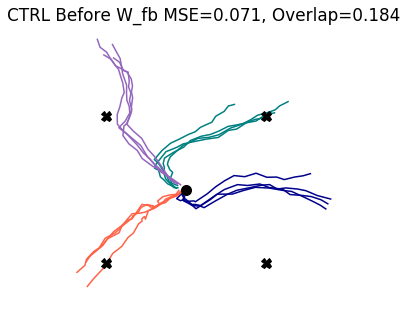

...

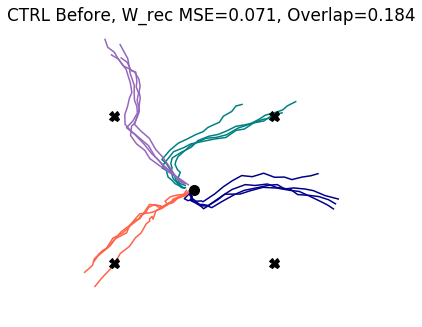

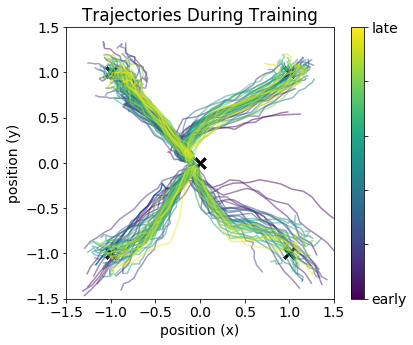

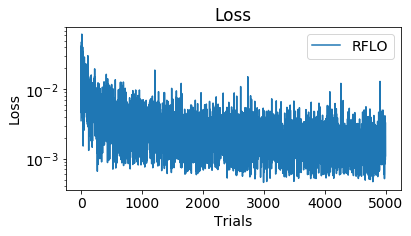

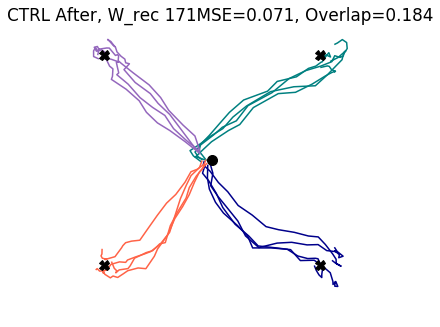

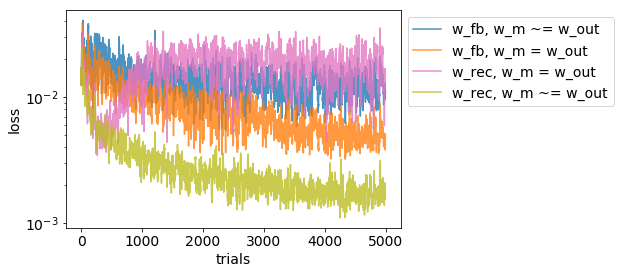

5000it [00:10, 463.58it/s]
5000it [00:08, 570.19it/s]
5000it [00:11, 431.13it/s]
5000it [00:11, 435.34it/s]


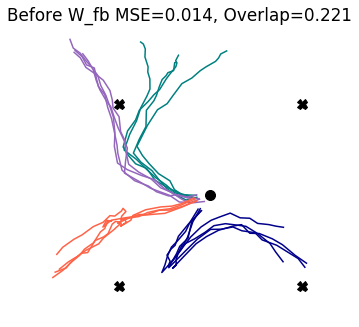

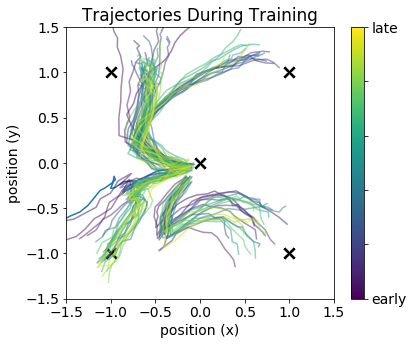

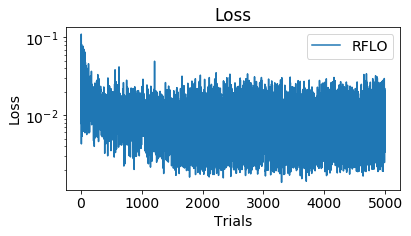

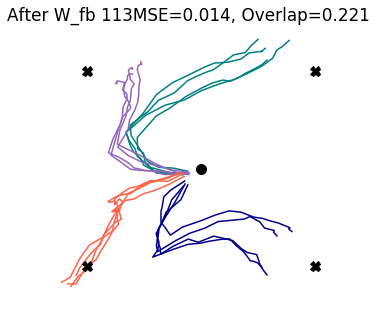

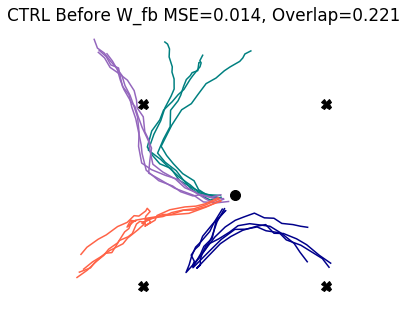

...

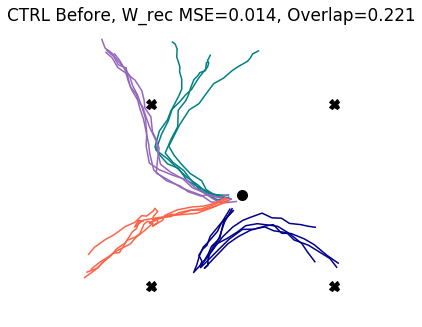

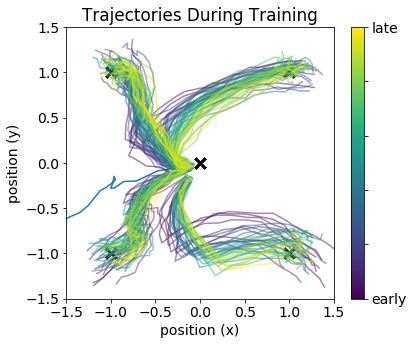

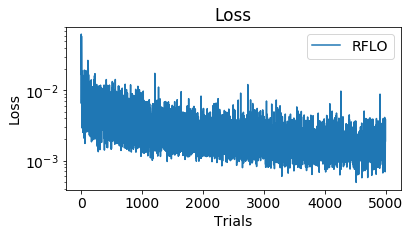

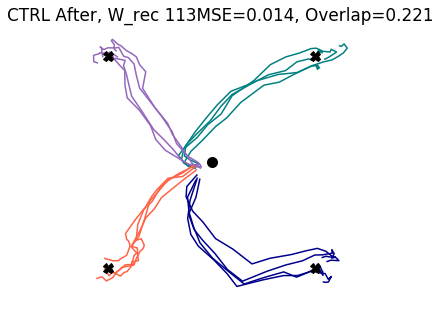

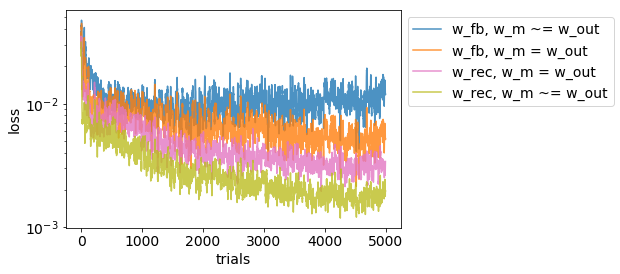

5000it [00:10, 487.13it/s]
5000it [00:09, 540.19it/s]
5000it [00:11, 421.08it/s]
5000it [00:11, 420.79it/s]


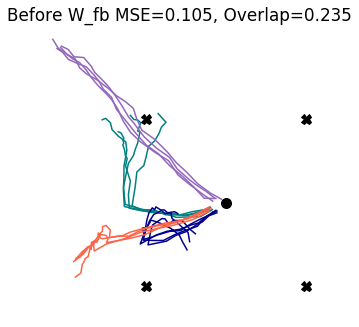

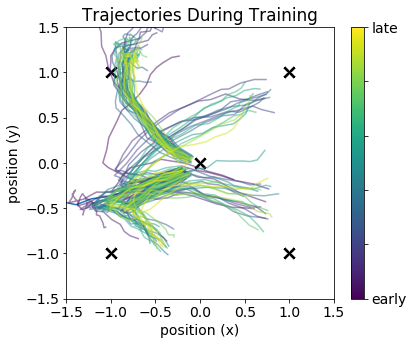

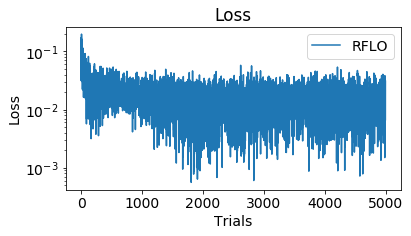

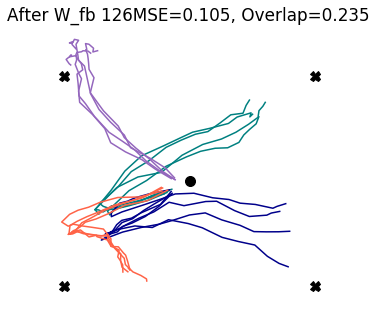

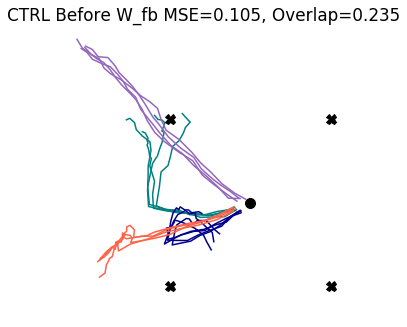

...

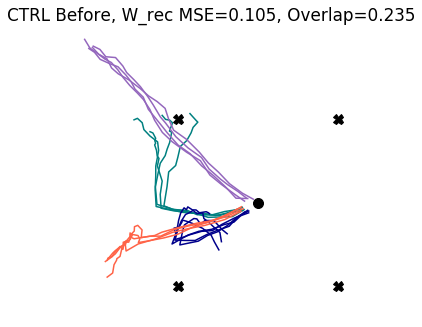

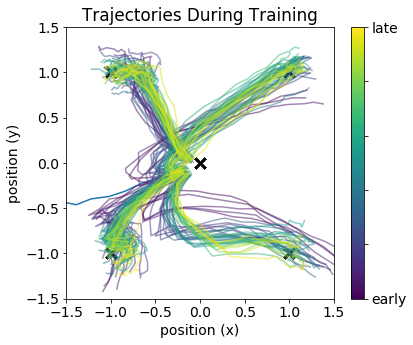

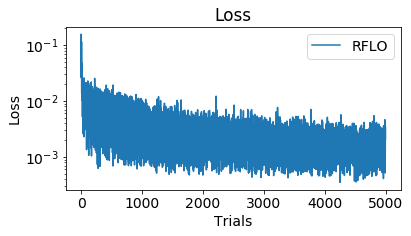

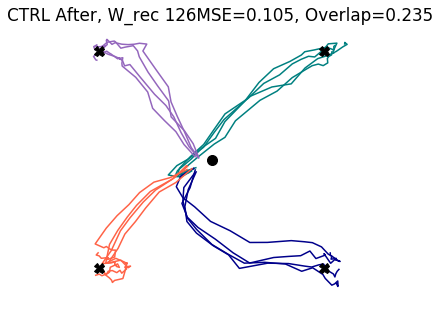

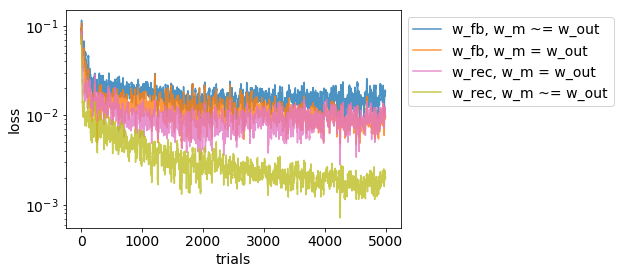

5000it [00:08, 560.37it/s]
5000it [00:09, 529.33it/s]
5000it [00:13, 369.99it/s]
5000it [00:14, 343.98it/s]


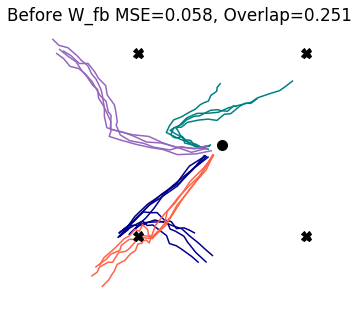

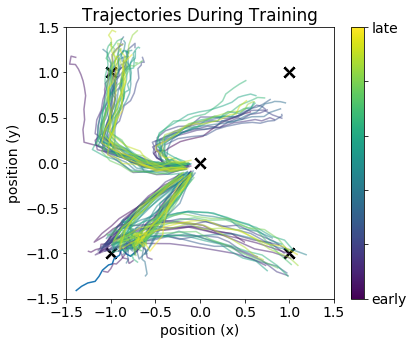

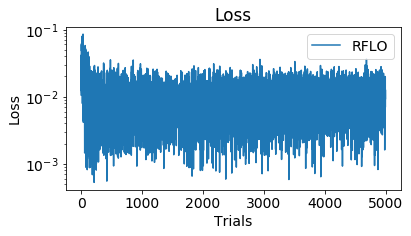

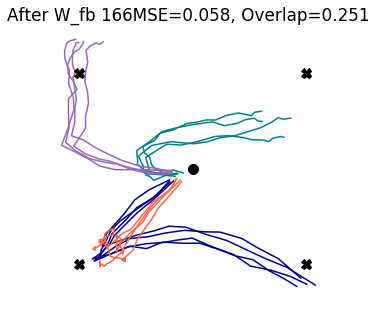

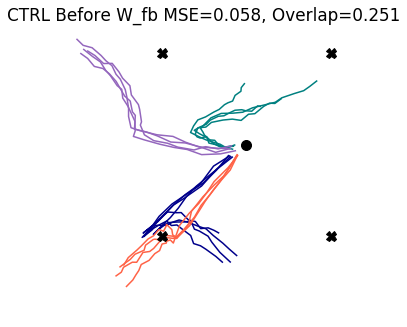

...

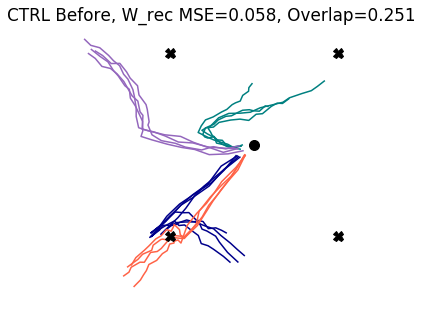

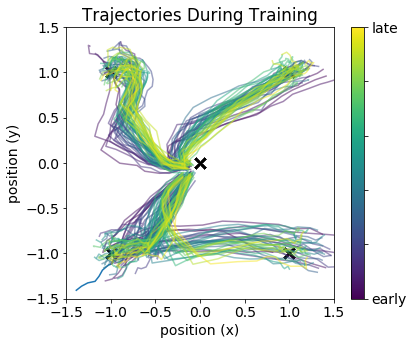

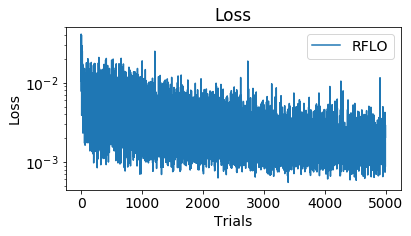

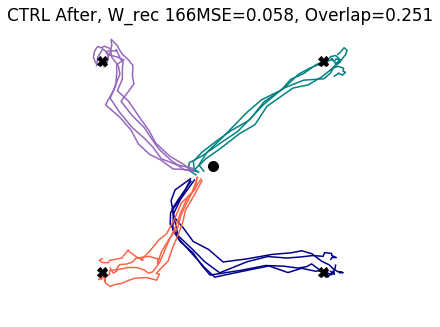

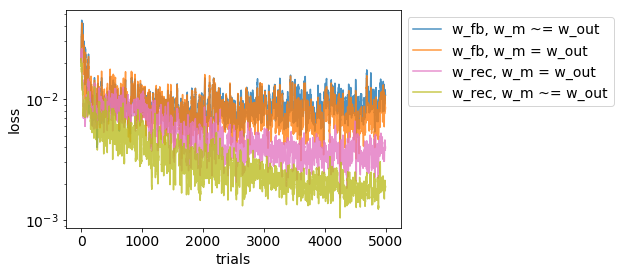

In [59]:
for T_wm,name,ind in zip(T_wm_overlap_list,names,overlap_ind[:4]):

    """ Initialize Networks """
    net2 = RNN(params)
    
    net2.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    #net2.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=T_wm.T)
    net2.set_weights(w_out=T_wm)
    
    net2_ctrl = RNN(params)
    net2_ctrl.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb)) 
    net2_ctrl.set_weights(w_m=T_wm.T,w_out=T_wm) # use "permuted" internal matrix
    
    net2_rec = RNN(params)
    net2_rec.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_m=np.copy(net1.w_m),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net2_rec.set_weights(w_out= T_wm )
    
    net2_rec_ctrl = RNN(params)
    net2_rec_ctrl.set_weights(w_in=np.copy(net1.w_in),w_rec=np.copy(net1.w_rec),w_fb=np.copy(net1.w_fb)) # keep "nonpermuted" internal matrix
    net2_rec_ctrl.set_weights(w_out= T_wm, w_m = T_wm.T )


    # initialize simulation
    sim2 = Simulation(net2)

    rflo = RFLO(net2,apply_to=['w_fb'],weight_transport=False) # weight_transport doesn't matter here, because we are not learning w_out

    fig = plot_trained_trajectories(sim=sim2, tasks=[task1,task2,task3,task4],title='Before W_fb '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim2.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=50)

    fig = plot_trained_trajectories(sim=sim2, tasks=[task1,task2,task3,task4],title='After W_fb '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    """ Control Experiment """
    sim2_ctrl = Simulation(net2_ctrl)
    
    rflo = RFLO(net2_ctrl,apply_to=['w_fb'],weight_transport=False) # weight_transport doesn't matter here, because we are not learning w_out

    fig = plot_trained_trajectories(sim=sim2_ctrl, tasks=[task1,task2,task3,task4],title='CTRL Before W_fb '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim2_ctrl.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=50)

    fig = plot_trained_trajectories(sim=sim2_ctrl, tasks=[task1,task2,task3,task4],title='CTRL After W_fb '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    """ train w_rec """
    
    sim2_rec = Simulation(net2_rec)

    rflo = RFLO(net2_rec,apply_to=['w_rec']) 

    fig = plot_trained_trajectories(sim=sim2_rec, tasks=[task1,task2,task3,task4],title='Before, W_rec'+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim2_rec.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

    fig = plot_trained_trajectories(sim=sim2_rec, tasks=[task1,task2,task3,task4],title='After, W_frec - '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    
    """ Control Experiment with w_rec """
    sim2_rec_ctrl = Simulation(net2_rec_ctrl)
    
    rflo = RFLO(net2_rec_ctrl,apply_to=['w_rec'])

    fig = plot_trained_trajectories(sim=sim2_rec_ctrl, tasks=[task1,task2,task3,task4],title='CTRL Before, W_rec '+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))

    sim2_rec_ctrl.run_session(n_trials=5000, tasks=[task1,task2,task3,task4], learn_alg=[rflo], probe_types=['loss'], plot=True, plot_freq=25)

    fig = plot_trained_trajectories(sim=sim2_rec_ctrl, tasks=[task1,task2,task3,task4],title='CTRL After, W_rec '+name+'MSE={:.3f}, Overlap={:.3f}'.format(mean_list[ind],overlap_list[ind]))
    
    
    plt.show()
    
    

    """ Plot Loss with moving average """
    av0 = uniform_filter1d(np.mean(sim2.session_probes['loss'],axis=1),10)
    plt.plot(av0,label='w_fb, w_m ~= w_out',color='C0',alpha=0.8)
    av1 = uniform_filter1d(np.mean(sim2_ctrl.session_probes['loss'],axis=1),10)
    plt.plot(av1,label='w_fb, w_m = w_out',color='C1',alpha=0.8)
    av2 = uniform_filter1d(np.mean(sim2_rec.session_probes['loss'],axis=1),10)
    plt.plot(av2,label='w_rec, w_m = w_out',color='C6',alpha=0.8)
    av3 = uniform_filter1d(np.mean(sim2_rec_ctrl.session_probes['loss'],axis=1),10)
    plt.plot(av3,label='w_rec, w_m ~= w_out',color='C8',alpha=0.8)
    plt.yscale('log')
    plt.xlabel('trials')
    plt.ylabel('loss')
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()
